# 1. Topographic Map

In [ ]:
import pygmt
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# === 设置工作目录 ===
os.chdir(r"C:/Users/Administrator/Desktop/AFM/pyGMT")

# === 创建图像 ===
fig = pygmt.Figure()
region = [99, 117, 33, 42]
projection = "M15c"

# === 加载地形背景 ===
grid = pygmt.datasets.load_earth_relief(resolution="01m", region=region)
pygmt.makecpt(cmap="white,255/255/255,250/250/250,240/240/240", series="-500/8000/1000", reverse=True)

fig.grdimage(
    grid=grid, 
    projection=projection,
    shading="-I+d+a0.01",
    cmap=True
)

# === 加载点数据 ===
df_pts   = pd.read_csv("unique_points_with_count72.gmt", delim_whitespace=True, header=None, names=["lon", "lat", "number"])
df_roots = pd.read_csv("unique_points_with_count24.gmt", delim_whitespace=True, header=None, names=["lon", "lat", "number"])

df_pts = df_pts.apply(pd.to_numeric, errors='coerce')
df_roots = df_roots.apply(pd.to_numeric, errors='coerce')

size_mapping = {
    1: 0.12, 2: 0.14, 3: 0.16, 4: 0.18,
    5: 0.20, 8: 0.22, 10: 0.24, 14: 0.26
}
df_pts["size"] = df_pts["number"].map(size_mapping).fillna(0.12)
df_roots["size"] = df_roots["number"].map(size_mapping).fillna(0.12)

# === 绘制实际数据点 ===
fig.plot(
    x=df_pts["lon"], y=df_pts["lat"],
    style="c", size=df_pts["size"],
    fill="#0072B2", pen="0.3p,black",
    label="Forest Sites"
)
fig.plot(
    x=df_roots["lon"], y=df_roots["lat"],
    style="c", size=df_roots["size"],
    fill="#D55E00", pen="0.3p,black",
    label="Cropland Sites"
)

# === 添加图例专用示意点（触发 legend）===
legend_counts = [1,2, 3, 4,5, 8, 10, 14]  # 选择要展示在图例中的点数量
for i, count in enumerate(legend_counts):
    size = size_mapping[count]
    fig.plot(
        x=[98.5], y=[44.5 - i * 0.3],   # 每个圆圈向下偏移避免重叠
        style=f"c{size}c",
        fill="black",
        pen="0.3p,black",
        label=f"n = {count}"
    )
fig.plot(x=[98.5], y=[44.5], style="c0.22c", fill="#0072B2", pen="0.3p,black", label="Forest Sites")
fig.plot(x=[98.5], y=[44.5], style="c0.22c", fill="#D55E00", pen="0.3p,black", label="Cropland Sites")

# === 边界图层与颜色统一 ===
fig.plot(data="Isohyet.gmt", pen="1p,#4682B4", label="Rainfall Isolines")
#fig.plot(data="Maowusu_Desert.gmt", pen="1p,#A0522D", label="Maowusu Desert")
fig.plot(data="Loess_Plateau.gmt", pen="1p,#8B4513", label="Loess Plateau")
fig.plot(data="Loess_region.gmt", pen="2p,#000000", label="Loess Region")
# === 设置地图样式、比例尺、指北针 ===
with pygmt.config(
    FONT="16p,Helvetica,#4A4A4A",
    FONT_TAG="16p,Helvetica,#4A4A4A",
    FONT_LABEL="16p,Helvetica,#4A4A4A",
    FONT_ANNOT_PRIMARY="16p,Helvetica,#4A4A4A",
    MAP_FRAME_PEN="1p,#4A4A4A",
    MAP_TICK_LENGTH="0.2c"               # ✅ 设置刻度线长度
  #  MAP_TICK_PEN="0.5p,#4A4A4A",
  #  MAP_GRID_PEN="0.25p,#AAAAAA",
  #  MAP_FRAME_TYPE="plain" 
):
    fig.basemap(region=region, projection=projection, frame=["WSen", "xa3f2+lx°E", "ya3f2+ly°N"])
    fig.basemap(rose="jTR+w1.5c+f1+l+o0.2c+pen0.5p,#4A4A4A")
    fig.basemap(map_scale="jBL+w400k+f+lKm+ar+o0.2/0.5c")

# === 添加图例框 ===
#fig.legend(position="JBR+jBR+o0.4c", box="+gwhite+p0.5p,#4A4A4A")

# === 小地图 ===
# 主地图
# === 小地图（主 inset：中国全图）===
with fig.inset(position="jTL+w3.0c+o0.01c", box="+p1p,black"):
    fig.coast(
        region=[70, 140, -5, 55],
        projection="M4.0c",
        #land="lightgray",
        land="white",
        water="white"
    )
    fig.plot(data="china_border.gmt", pen="0.1p,#4A4A4A")
    fig.plot(data="Loess_Plateau.gmt", pen="1p,#8B4513")
    fig.plot(data="bianjing.gmt", pen="0.1p,#4A4A4A")
    #fig.plot(data="China2.gmt", pen="0.1p,#4A4A4A")

# ===================================================================================
# === INSET 2: 南海九段线放大图（放在主地图的右下角 jBR）===
# 注意：这不是嵌套！是独立的第二个 inset
# ===================================================================================
with fig.inset(position="x1.75c/6.25c+w1.0c+o0.2c", box="+p0.5p,black"):#,gray+gwhite
    fig.coast(
        region=[105, 125, 3, 25],  # 南海区域
        projection="M3.0c",
        land="white",
#        land="lightgray",
        water="white"
        #shorelines="0.2p,#4A4A4A"
    )
    # 绘制国界（自动裁剪到当前 region）
    fig.plot(data="china_border.gmt", pen="0.1p,#4A4A4A")      # 红色突出九段线
    fig.plot(data="bianjing.gmt", pen="0.8p,#4A4A4A")
    fig.plot(data="Loess_Plateau.gmt", pen="1p,#8B4513")
    #fig.plot(data="China2.gmt", pen="0.1p,#4A4A4A")
fig.savefig(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\final_map.png", dpi=300)
fig.show()

# 2. Parameter Optimization Chart

## 2.1 All Sites

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 59 candidates, totalling 590 fits
Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 9 candidates, totalling 90 fits
Fitting 10 folds for each of 8 candidates, totalling 80 fits


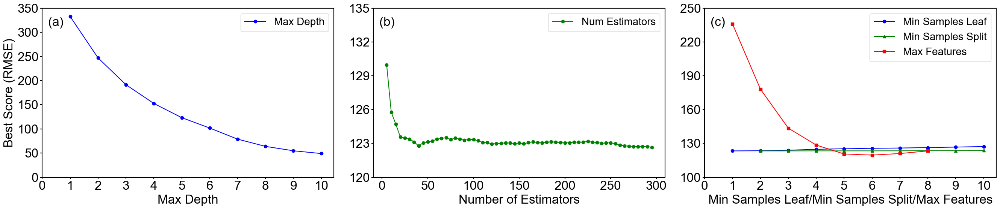

In [1]:
# -*- coding: utf-8 -*-
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
# 设置字体为 Times New Roman
plt.rcParams["font.family"] = "Arial"
#plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# 读取数据
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')

rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 11)) 

for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    site_row = np.size(site, 0) 
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # list转为dataframe
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 11))
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200  # 计算累计*(depth-3.1)
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k-1, 2:11]  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:9]  # 输入特征
y = -err.iloc[:, 0]  # 目标变量
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)  # 30%为测试集，则70%为训练集

# 创建1行3列子图
fig, axes = plt.subplots(1, 3, figsize=(27, 6))  # 宽一些

# ===== 第一个子图：max_depth =====
param_grid = {'max_depth': np.arange(1, 11)}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
max_depths = results['param_max_depth'].data

axes[0].plot(max_depths, best_scores, marker='o', linestyle='-', color='blue', label='Max Depth')
axes[0].set_xlabel('Max Depth')
axes[0].set_ylabel('Best Score (RMSE)')
#axes[0].set_title('(a)')
axes[0].legend()
axes[0].set_xticks(np.arange(0, 11, 1))
axes[0].text(0.02, 0.95, '(a)', transform=axes[0].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[0].set_yticks(np.linspace(0, 350, 8))
axes[0].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')

# ===== 第二个子图：n_estimators =====
param_grid = {'n_estimators': np.arange(5, 300, 5), 'max_depth': [5]}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
n_estimators = results['param_n_estimators'].data

axes[1].plot(n_estimators, best_scores, marker='o', linestyle='-', color='green', label='Num Estimators')
axes[1].set_xlabel('Number of Estimators')
#axes[1].set_ylabel('Best Score (RMSE)')
#axes[1].set_title('(b)')
axes[1].legend()
axes[1].text(0.02, 0.95, '(b)', transform=axes[1].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[1].set_xticks(np.arange(0, 350, 50))
axes[1].set_yticks(np.linspace(120, 135, 6))
axes[1].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 第三个子图：min_samples_leaf / split / max_features =====
param_grid1 = {'min_samples_leaf': np.arange(1, 11), 'max_depth': [5]}
rf1 = RandomForestRegressor(random_state=42)
grid_search1 = GridSearchCV(estimator=rf1, param_grid=param_grid1, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search1.fit(x_train, y_train)
results1 = grid_search1.cv_results_
best_scores1 = np.sqrt(-results1['mean_test_score'])
min_samples_leaf = results1['param_min_samples_leaf'].data

param_grid2 = {'min_samples_split': np.arange(2, 11), 'max_depth': [5]}
rf2 = RandomForestRegressor(random_state=42)
grid_search2 = GridSearchCV(estimator=rf2, param_grid=param_grid2, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search2.fit(x_train, y_train)
results2 = grid_search2.cv_results_
best_scores2 = np.sqrt(-results2['mean_test_score'])
min_samples_split = results2['param_min_samples_split'].data

param_grid3 = {'max_features': np.arange(1, 9), 'max_depth': [5]}
rf3 = RandomForestRegressor(random_state=42)
grid_search3 = GridSearchCV(estimator=rf3, param_grid=param_grid3, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search3.fit(x_train, y_train)
results3 = grid_search3.cv_results_
best_scores3 = np.sqrt(-results3['mean_test_score'])
max_features = results3['param_max_features'].data

axes[2].plot(min_samples_leaf, best_scores1, marker='o', linestyle='-', color='blue', label='Min Samples Leaf')
axes[2].plot(min_samples_split, best_scores2, marker='^', linestyle='-', color='green', label='Min Samples Split')
axes[2].plot(max_features, best_scores3, marker='s', linestyle='-', color='red', label='Max Features')
axes[2].set_xlabel('Min Samples Leaf/Min Samples Split/Max Features')#Parameter Value:
#axes[2].set_ylabel('Best Score (RMSE)')
#axes[2].set_title('(c)')
axes[2].legend()
axes[2].set_xticks(np.arange(0, 11, 1))
axes[2].text(0.02, 0.95, '(c)', transform=axes[2].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[2].set_yticks(np.linspace(100, 250, 6))
axes[2].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 自动调整布局 =====
plt.tight_layout()
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat72.png', dpi=300, bbox_inches='tight')
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat72.svg', format='svg')
plt.show()

## 2.2 Sites with Root Data (Without Root Variables)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_24732\3045153088.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 59 candidates, totalling 590 fits
Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 9 candidates, totalling 90 fits
Fitting 10 folds for each of 8 candidates, totalling 80 fits


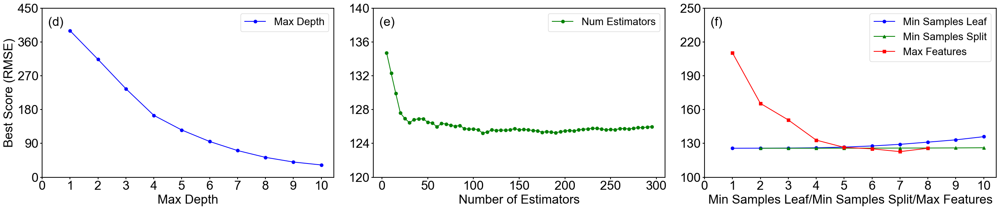

In [2]:
# -*- coding: utf-8 -*-
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
# 设置字体为 Times New Roman
plt.rcParams["font.family"] = "Arial"
#plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# 读取数据
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = -err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)  # 30%为测试集，则70%为训练集

# 创建1行3列子图
fig, axes = plt.subplots(1, 3, figsize=(27, 6))  # 宽一些

# ===== 第一个子图：max_depth =====
param_grid = {'max_depth': np.arange(1, 11)}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
max_depths = results['param_max_depth'].data

axes[0].plot(max_depths, best_scores, marker='o', linestyle='-', color='blue', label='Max Depth')
axes[0].set_xlabel('Max Depth')
axes[0].set_ylabel('Best Score (RMSE)')
#axes[0].set_title('(a)')
axes[0].legend()
axes[0].set_xticks(np.arange(0, 11, 1))
axes[0].text(0.02, 0.95, '(d)', transform=axes[0].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[0].set_yticks(np.linspace(0, 450, 6))
axes[0].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')

# ===== 第二个子图：n_estimators =====
param_grid = {'n_estimators': np.arange(5, 300, 5), 'max_depth': [5]}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
n_estimators = results['param_n_estimators'].data

axes[1].plot(n_estimators, best_scores, marker='o', linestyle='-', color='green', label='Num Estimators')
axes[1].set_xlabel('Number of Estimators')
#axes[1].set_ylabel('Best Score (RMSE)')
#axes[1].set_title('(b)')
axes[1].legend()
axes[1].text(0.02, 0.95, '(e)', transform=axes[1].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[1].set_xticks(np.arange(0, 350, 50))
axes[1].set_yticks(np.linspace(120, 140, 6))
axes[1].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 第三个子图：min_samples_leaf / split / max_features =====
param_grid1 = {'min_samples_leaf': np.arange(1, 11), 'max_depth': [5]}
rf1 = RandomForestRegressor(random_state=42)
grid_search1 = GridSearchCV(estimator=rf1, param_grid=param_grid1, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search1.fit(x_train, y_train)
results1 = grid_search1.cv_results_
best_scores1 = np.sqrt(-results1['mean_test_score'])
min_samples_leaf = results1['param_min_samples_leaf'].data

param_grid2 = {'min_samples_split': np.arange(2, 11), 'max_depth': [5]}
rf2 = RandomForestRegressor(random_state=42)
grid_search2 = GridSearchCV(estimator=rf2, param_grid=param_grid2, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search2.fit(x_train, y_train)
results2 = grid_search2.cv_results_
best_scores2 = np.sqrt(-results2['mean_test_score'])
min_samples_split = results2['param_min_samples_split'].data

param_grid3 = {'max_features': np.arange(1, 9), 'max_depth': [5]}
rf3 = RandomForestRegressor(random_state=42)
grid_search3 = GridSearchCV(estimator=rf3, param_grid=param_grid3, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search3.fit(x_train, y_train)
results3 = grid_search3.cv_results_
best_scores3 = np.sqrt(-results3['mean_test_score'])
max_features = results3['param_max_features'].data

axes[2].plot(min_samples_leaf, best_scores1, marker='o', linestyle='-', color='blue', label='Min Samples Leaf')
axes[2].plot(min_samples_split, best_scores2, marker='^', linestyle='-', color='green', label='Min Samples Split')
axes[2].plot(max_features, best_scores3, marker='s', linestyle='-', color='red', label='Max Features')
axes[2].set_xlabel('Min Samples Leaf/Min Samples Split/Max Features')#Parameter Value:
#axes[2].set_ylabel('Best Score (RMSE)')
#axes[2].set_title('(c)')
axes[2].legend()
axes[2].set_xticks(np.arange(0, 11, 1))
axes[2].text(0.02, 0.95, '(f)', transform=axes[2].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[2].set_yticks(np.linspace(100, 250, 6))
axes[2].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 自动调整布局 =====
plt.tight_layout()
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat24_withoutroot.png', dpi=300, bbox_inches='tight')
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat24_withoutroot.svg', format='svg',bbox_inches='tight')
plt.show()

## 2.3 Sites with Root Data (With Root Variables)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_24732\3851909204.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 59 candidates, totalling 590 fits
Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 9 candidates, totalling 90 fits
Fitting 10 folds for each of 8 candidates, totalling 80 fits


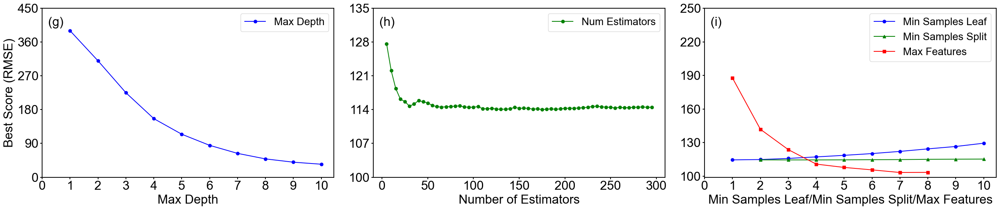

In [3]:
# -*- coding: utf-8 -*-
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
# 设置字体为 Times New Roman
plt.rcParams["font.family"] = "Arial"
#plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# 读取数据
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = -err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)  # 30%为测试集，则70%为训练集

# 创建1行3列子图
fig, axes = plt.subplots(1, 3, figsize=(27, 6))  # 宽一些

# ===== 第一个子图：max_depth =====
param_grid = {'max_depth': np.arange(1, 11)}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
max_depths = results['param_max_depth'].data

axes[0].plot(max_depths, best_scores, marker='o', linestyle='-', color='blue', label='Max Depth')
axes[0].set_xlabel('Max Depth')
axes[0].set_ylabel('Best Score (RMSE)')
#axes[0].set_title('(a)')
axes[0].legend()
axes[0].set_xticks(np.arange(0, 11, 1))
axes[0].text(0.02, 0.95, '(g)', transform=axes[0].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[0].set_yticks(np.linspace(0, 450, 6))
axes[0].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')

# ===== 第二个子图：n_estimators =====
param_grid = {'n_estimators': np.arange(5, 300, 5), 'max_depth': [5]}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
n_estimators = results['param_n_estimators'].data

axes[1].plot(n_estimators, best_scores, marker='o', linestyle='-', color='green', label='Num Estimators')
axes[1].set_xlabel('Number of Estimators')
#axes[1].set_ylabel('Best Score (RMSE)')
#axes[1].set_title('(b)')
axes[1].legend()
axes[1].text(0.02, 0.95, '(h)', transform=axes[1].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[1].set_xticks(np.arange(0, 350, 50))
axes[1].set_yticks(np.linspace(100, 135, 6))
axes[1].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 第三个子图：min_samples_leaf / split / max_features =====
param_grid1 = {'min_samples_leaf': np.arange(1, 11), 'max_depth': [5]}
rf1 = RandomForestRegressor(random_state=42)
grid_search1 = GridSearchCV(estimator=rf1, param_grid=param_grid1, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search1.fit(x_train, y_train)
results1 = grid_search1.cv_results_
best_scores1 = np.sqrt(-results1['mean_test_score'])
min_samples_leaf = results1['param_min_samples_leaf'].data

param_grid2 = {'min_samples_split': np.arange(2, 11), 'max_depth': [5]}
rf2 = RandomForestRegressor(random_state=42)
grid_search2 = GridSearchCV(estimator=rf2, param_grid=param_grid2, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search2.fit(x_train, y_train)
results2 = grid_search2.cv_results_
best_scores2 = np.sqrt(-results2['mean_test_score'])
min_samples_split = results2['param_min_samples_split'].data

param_grid3 = {'max_features': np.arange(1, 9), 'max_depth': [5]}
rf3 = RandomForestRegressor(random_state=42)
grid_search3 = GridSearchCV(estimator=rf3, param_grid=param_grid3, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search3.fit(x_train, y_train)
results3 = grid_search3.cv_results_
best_scores3 = np.sqrt(-results3['mean_test_score'])
max_features = results3['param_max_features'].data

axes[2].plot(min_samples_leaf, best_scores1, marker='o', linestyle='-', color='blue', label='Min Samples Leaf')
axes[2].plot(min_samples_split, best_scores2, marker='^', linestyle='-', color='green', label='Min Samples Split')
axes[2].plot(max_features, best_scores3, marker='s', linestyle='-', color='red', label='Max Features')
axes[2].set_xlabel('Min Samples Leaf/Min Samples Split/Max Features')#Parameter Value:
#axes[2].set_ylabel('Best Score (RMSE)')
#axes[2].set_title('(c)')
axes[2].legend()
axes[2].set_xticks(np.arange(0, 11, 1))
axes[2].text(0.02, 0.95, '(i)', transform=axes[2].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[2].set_yticks(np.linspace(100, 250, 6))
axes[2].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 自动调整布局 =====
plt.tight_layout()
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat24_withroot.png', dpi=300, bbox_inches='tight')
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat24_withroot.svg', format='svg')
plt.show()

# 3. Proportionality Plot (Effect of Data Proportions on the Model)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
import time
# 设置字体为 Times New Roman
plt.rcParams["font.family"] = "Arial"
#plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20

# 读取数据
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')

rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 11)) 

for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    site_row = np.size(site, 0) 
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # list转为dataframe
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 11))
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200  # 计算累计*(depth-3.1)
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k-1, 2:11]  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:9]  # 输入特征
y = -err.iloc[:, 0]  # 目标变量

# 结果列表
results = []

# 外层循环 test_size
for test_size in np.arange(0.01, 0.995, 0.01):
    temp_mse_train = []
    temp_rmse_train = []
    temp_r2_train = []
    temp_mse_test = []
    temp_rmse_test = []
    temp_r2_test = []
    temp_run_time = []

    for repeat in range(100):
        start_time = time.time()

        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=test_size)

        model = RandomForestRegressor(random_state=42, n_estimators=60, max_features=4, min_samples_leaf=1, min_samples_split=2, max_depth=5)
        model.fit(x_train, y_train)

        y_train_pred = model.predict(x_train)
        y_test_pred = model.predict(x_test)

        mse_train = mean_squared_error(y_train, y_train_pred)
        rmse_train = np.sqrt(mse_train)
        r2_train = r2_score(y_train, y_train_pred)

        mse_test = mean_squared_error(y_test, y_test_pred)
        rmse_test = np.sqrt(mse_test)
        r2_test = r2_score(y_test, y_test_pred)

        end_time = time.time()
        run_time = end_time - start_time

        temp_mse_train.append(mse_train)
        temp_rmse_train.append(rmse_train)
        temp_r2_train.append(r2_train)
        temp_mse_test.append(mse_test)
        temp_rmse_test.append(rmse_test)
        temp_r2_test.append(r2_test)
        temp_run_time.append(run_time)

    # 计算均值和标准差
    results.append([
        test_size,
        np.mean(temp_mse_train), np.std(temp_mse_train),
        np.mean(temp_rmse_train), np.std(temp_rmse_train),
        np.mean(temp_r2_train), np.std(temp_r2_train),
        np.mean(temp_mse_test), np.std(temp_mse_test),
        np.mean(temp_rmse_test), np.std(temp_rmse_test),
        np.mean(temp_r2_test), np.std(temp_r2_test),
        np.mean(temp_run_time), np.std(temp_run_time),
        len(y_train), len(y_test)
    ])

# 转换为DataFrame
columns = [
    'test_size',
    'mse_train_mean', 'mse_train_std',
    'rmse_train_mean', 'rmse_train_std',
    'r2_train_mean', 'r2_train_std',
    'mse_test_mean', 'mse_test_std',
    'rmse_test_mean', 'rmse_test_std',
    'r2_test_mean', 'r2_test_std',
    'run_time_mean', 'run_time_std',
    'y_train_size', 'y_test_size'
]

results_df = pd.DataFrame(results, columns=columns)

# 保存
results_df.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model_performance100runs_lonlat.xlsx', index=False)

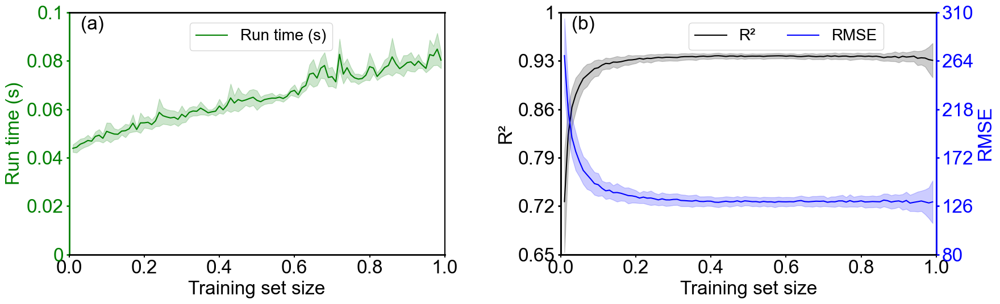

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

# ===== 读取数据 =====
df = pd.read_excel(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model_performance100runs_lonlat.xlsx")
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5

x = (1 - df["test_size"].to_numpy())

# ---- 指标数据 ----
test_r2_mean = df["r2_test_mean"].to_numpy()
test_r2_std = df["r2_test_std"].to_numpy()
test_rmse_mean = df["rmse_test_mean"].to_numpy()
test_rmse_std = df["rmse_test_std"].to_numpy()
run_time_mean = df["run_time_mean"].to_numpy()
run_time_std = df["run_time_std"].to_numpy()

# ===== 坐标范围 =====
r2_min, r2_max = 0.65, 1.00
rmse_min, rmse_max = 80, 310
runtime_min, runtime_max = 0, 0.10
size_min, size_max = 0, 3500

# ===== 刻度格式器 =====
fmt_sig2 = FuncFormatter(lambda v, pos: f"{v:.2g}")

# 创建画布：1行2列
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# =========================
# 子图 (a): 只显示 Run time（绿色）在左侧，隐藏左轴，绿色轴左移
# =========================
ax0 = axes[0]

# 直接绘制 run time
ax0.plot(x, run_time_mean, color='green', label="Run time (s)")
ax0.fill_between(x, run_time_mean - run_time_std, run_time_mean + run_time_std,
                 color='green', alpha=0.2)

# 设置 y 轴（绿色）
ax0.set_ylabel("Run time (s)", color='green')
ax0.tick_params(axis='y', colors='green', width=2)
ax0.set_ylim(runtime_min, runtime_max)
ax0.set_yticks(np.linspace(runtime_min, runtime_max, 6))
ax0.yaxis.set_major_formatter(fmt_sig2)

# x 轴
ax0.set_xlabel("Training set size")
ax0.set_xlim(0, 1)

# 设置边框线
ax0.spines['left'].set_color('green')
ax0.spines['left'].set_linewidth(2)
ax0.spines['bottom'].set_linewidth(2)
ax0.spines['top'].set_linewidth(2)
ax0.spines['right'].set_visible(2)

# 图例
ax0.legend(loc='upper left', bbox_to_anchor=(0.30, 0.99))


# =========================
# 子图 (b): R² (左黑) + RMSE (右蓝)
# =========================
ax1 = axes[1]

# ---- 左轴：R² ----
ax1.plot(x, test_r2_mean, color='black', label="R²")
ax1.fill_between(x, test_r2_mean - test_r2_std, test_r2_mean + test_r2_std,
                 color='black', alpha=0.2)
ax1.set_xlabel("Training set size")
ax1.set_ylabel("R²", color='black')
ax1.tick_params(axis='y', colors='black', width=2)
ax1.set_ylim(r2_min, r2_max)
ax1.set_yticks(np.linspace(r2_min, r2_max, 6))
ax1.yaxis.set_major_formatter(fmt_sig2)
ax1.set_xlim(0, 1)
ax1.spines['left'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['right'].set_visible(2)

# ---- 右轴：RMSE ----
ax1_r = ax1.twinx()
ax1_r.plot(x, test_rmse_mean, color='blue', label="RMSE")
ax1_r.fill_between(x, test_rmse_mean - test_rmse_std, test_rmse_mean + test_rmse_std,
                   color='blue', alpha=0.2)
ax1_r.set_ylabel("RMSE", color='blue')
ax1_r.tick_params(axis='y', colors='blue', width=2)
ax1_r.set_ylim(rmse_min, rmse_max)
ax1_r.set_yticks(np.linspace(rmse_min, rmse_max, 6))
ax1_r.spines["right"].set_color('blue')
ax1_r.spines['right'].set_linewidth(2)

# ---- 合并图例 ----
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax1_r.get_legend_handles_labels()
#ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', bbox_to_anchor=(0.50, 0.50))
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center',        # 改为上中部，更适合横排
           bbox_to_anchor=(0.6, 0.99), # 调整位置，避免遮挡数据
           ncol=2,                    # 关键：2 列横排（R² 和 RMSE 并列）
           frameon=True)              # 可选：是否显示边框
#           fontsize=20)
# =========================
# 子图标签 (a), (b)
# =========================
fig.text(0.09, 0.88, "(a)", ha='left', va='top', fontname='Arial', fontsize=24)
fig.text(0.57, 0.88, "(b)", ha='left', va='top', fontname='Arial', fontsize=24)

# =========================
# 布局与保存
# =========================
plt.tight_layout(rect=(0, 0, 1, 0.96), h_pad=2.0, w_pad=2.5)
#plt.savefig(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\combined_metrics.svg", format='svg', dpi=300)
plt.show()

# 4. Density Plot (Data Density Distribution)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# ====== 模型1 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x1 = err.iloc[:, 1:11]
y1 = err.iloc[:, 0]
x1.rename(columns={
    1: 'Depth(m)', 2: 'Precipitation(mm)', 3: 'PET(mm)', 4: 'Clay(%)',
    5: 'Sand(%)', 6: 'Silt(%)', 7: 'Tree Age(year)', 8: 'Tree Species',
    9: 'Longitude', 10:'Latitude'
}, inplace=True)
x1 = x1[['Depth(m)', 'Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(x1, y1, test_size=0.3, random_state=42)
rfr1 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr1.fit(X_train1, Y_train1)

# ====== 模型2 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv', encoding='gbk')
err = np.empty((0, 20))
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 20)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x2 = err.iloc[:, 1:20]
y2 = err.iloc[:, 0]

rename_map = {
    1: 'Depth(m)',
    2:'Root Dry Weight Density',
    3:'Fine Root Length Density',
    4:'Tree Species',
    5:'Latitude',
    6:'Longitude',
    7:'Tree Age(year)',
    8:'P(mm yr-1)',
    9:'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}
x2 = x2.rename(columns=rename_map)         # inplace=False，重新赋值
sel_cols_base = ['Depth(m)', 'Tree Species','Tree Age(year)',
                 'Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']
x2 = x2[sel_cols_base]
X_train2, X_test2, Y_train2, Y_test2 = train_test_split(x2, y2, test_size=0.3, random_state=42)
rfr2 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr2.fit(X_train2, Y_train2)

# ====== 模型3（你可以复制模型2再换一套变量，比如增加 Root Dry Weight 和 Fine Root Length）======
x3 = err.iloc[:, 1:20].copy()
y3 = err.iloc[:, 0]
x3=x3.rename(columns=rename_map)
x3 = x3[['Depth(m)', 'Root Dry Weight Density','Fine Root Length Density','Tree Species','Latitude','Longitude','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
X_train3, X_test3, Y_train3, Y_test3 = train_test_split(x3, y3, test_size=0.3, random_state=42)
rfr3 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr3.fit(X_train3, Y_train3)

def export_predictions(depth, observed, predicted, filepath):
    # 重置索引
    depth = pd.Series(depth).reset_index(drop=True)
    observed = pd.Series(observed).reset_index(drop=True)
    predicted = pd.Series(predicted, name='Predicted')

    # 拼接
    depth_repeat = pd.concat([depth, depth], ignore_index=True)
    type_col = ['Observed SWSD'] * len(depth) + ['Predicted SWSD'] * len(depth)
    swsd_values = pd.concat([observed, predicted], ignore_index=True)

    export_df = pd.DataFrame({
        'Depth(m)': depth_repeat,
        'SWSD Value': swsd_values,
        'SWSD Type': type_col
    })

    # 导出
    export_df.to_excel(filepath, index=False)
    print(f"✅ 已导出: {filepath}")
# --- 模型1 ---
y1_pred = rfr1.predict(X_test1)
export_predictions(
    depth=X_test1['Depth(m)'],
    observed=Y_test1,
    predicted=y1_pred,
    filepath=r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model1_predictions.xlsx'
)

# --- 模型2 ---
y2_pred = rfr2.predict(X_test2)
export_predictions(
    depth=X_test2['Depth(m)'],
    observed=Y_test2,
    predicted=y2_pred,
    filepath=r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model2_predictions.xlsx'
)

# --- 模型3 ---
y3_pred = rfr3.predict(X_test3)
export_predictions(
    depth=X_test3['Depth(m)'],
    observed=Y_test3,
    predicted=y3_pred,
    filepath=r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model3_predictions.xlsx'
)

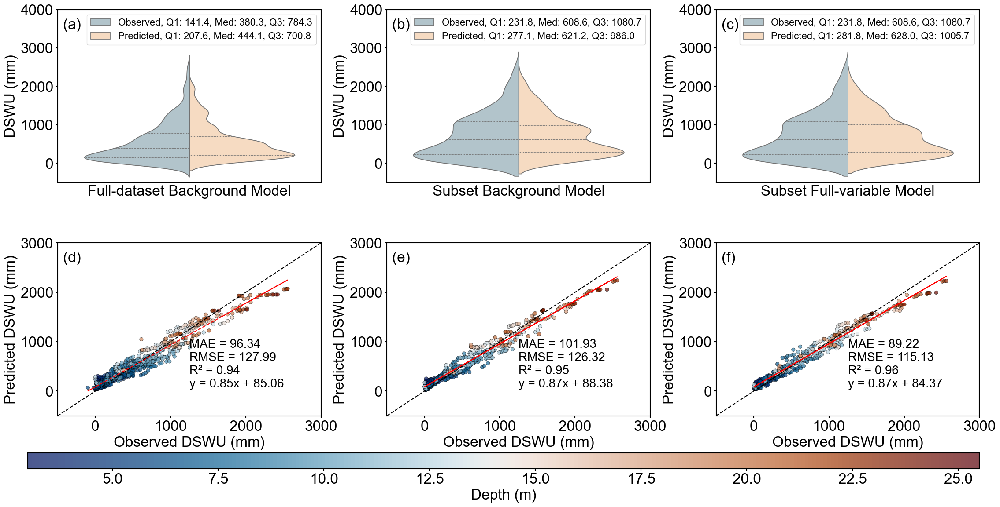

In [5]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from matplotlib.colors import LinearSegmentedColormap
# ====== 1. 设置全局样式 ======
plt.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 16
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# ====== 2. 读取三个模型的预测结果 ======
file_paths = {
    'Full-dataset Background Model': r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model1_predictions.xlsx',
    'Subset Background Model': r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model2_predictions.xlsx',
    'Subset Full-variable Model': r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model3_predictions.xlsx'
}
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\vik.txt") # 假设你下载了 batlow 的 txt 文件
batlow_map = LinearSegmentedColormap.from_list('batlow', cm_data)
models_data = {}
for model_name, path in file_paths.items():
    try:
        df = pd.read_excel(path)
    except:
        df = pd.read_csv(path)
    df.columns = ['Depth(m)', 'SWSD Value', 'SWSD Type']
    
    observed = df[df['SWSD Type'] == 'Observed SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
    predicted = df[df['SWSD Type'] == 'Predicted SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
    
    if len(observed) != len(predicted):
        min_len = min(len(observed), len(predicted))
        observed = observed.iloc[:min_len].reset_index(drop=True)
        predicted = predicted.iloc[:min_len].reset_index(drop=True)
        print(f"⚠️ {model_name}: Observed 和 Predicted 长度不一致，已截断为 {min_len}")
    
    paired = pd.DataFrame({
        'Depth(m)': observed['Depth(m)'],
        'Observed': observed['SWSD Value'],
        'Predicted': predicted['SWSD Value']
    })
    paired.dropna(inplace=True)
    models_data[model_name] = paired

# ====== 3. 自定义颜色 ======
color_start = plt.cm.RdBu_r(0.25)  # 紫色 (低端)
color_end = plt.cm.RdBu_r(0.75)    # 红色 (高端)
custom_palette = {
    "Observed":(174/255, 198/255, 207/255, 0.8),#'#1f77b4',#'#4dbbd5',  # 浅蓝 (174/255, 198/255, 207/255, 0.8)
    "Predicted":(255/255, 218/255, 185/255, 0.8)#'#ff7f0e'  # 浅橙(255/255, 218/255, 185/255, 1)
}

# ====== 4. 创建 2x3 子图 ======
fig, axes = plt.subplots(2, 3, figsize=(27, 12))
plt.subplots_adjust(hspace=0.35, wspace=0.25)

model_names = ['Full-dataset Background Model', 'Subset Background Model', 'Subset Full-variable Model']
y_violin = (-500, 4000)
y_scatter = (-500, 3000)
x_scatter = (-500, 3000)

# ---------- 第一行：小提琴图 ----------
for idx, model_name in enumerate(model_names):
    ax_v = axes[0, idx]
    data = models_data[model_name]
    y_test = data['Observed'].values
    y_pred = data['Predicted'].values
    
    obs_df = pd.DataFrame({'Value': y_test, 'Type': 'Observed'})
    pred_df = pd.DataFrame({'Value': y_pred, 'Type': 'Predicted'})
    df_plot = pd.concat([obs_df, pred_df], ignore_index=True)

    if not df_plot.empty:
        quartiles = df_plot.groupby('Type')['Value'].quantile([0.25, 0.5, 0.75]).unstack()
        legend_labels = [
            f'{t}, Q1: {quartiles.loc[t, 0.25]:.1f}, Med: {quartiles.loc[t, 0.5]:.1f}, Q3: {quartiles.loc[t, 0.75]:.1f}'
            for t in quartiles.index
        ]
        sns.violinplot(x=[0]*len(df_plot), y='Value', hue='Type', data=df_plot,
                       split=True, inner="quartile", palette=custom_palette, ax=ax_v)
        handles, _ = ax_v.get_legend_handles_labels()
        ax_v.legend(handles=handles, labels=legend_labels, loc='upper right')
    else:
        ax_v.text(0.5, 0.5, 'No data', transform=ax_v.transAxes, ha='center', va='center', color='red')

    ax_v.set_ylabel("DSWU (mm)")
    ax_v.set_xlabel(model_name)
    ax_v.set_xticks([])
    ax_v.set_ylim(y_violin)
    ax_v.text(0.02, 0.95, f"({chr(97 + idx)})", transform=ax_v.transAxes, ha='left', va='top', fontsize=24)

# ---------- 第二行：散点图 ----------
for idx, model_name in enumerate(model_names):
    ax_s = axes[1, idx]
    data = models_data[model_name]
    y_test = data['Observed'].values
    y_pred = data['Predicted'].values

    scatter = ax_s.scatter(y_test, y_pred, c=data['Depth(m)'].values, cmap=batlow_map, alpha=0.7, vmin=3, vmax=25.5,edgecolor='black', linewidth=0.5)
    lims = [max(x_scatter[0], y_scatter[0]), min(x_scatter[1], y_scatter[1])]
    ax_s.plot(lims, lims, '--', color='black', linewidth=1.5)

    z = np.polyfit(y_test, y_pred, 1)
    p = np.poly1d(z)
    ax_s.plot(y_test, p(y_test), 'r--', linewidth=1.5)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    equation = f'y = {z[0]:.2f}x + {z[1]:.2f}'
    ax_s.text(0.50, 0.15, f'MAE = {mae:.2f}\nRMSE = {rmse:.2f}\nR² = {r2:.2f}\n{equation}',
              transform=ax_s.transAxes, family='Arial', va='bottom')

    ax_s.set_xlim(x_scatter)
    ax_s.set_ylim(y_scatter)
    ax_s.set_xlabel('Observed DSWU (mm)')
    ax_s.set_ylabel('Predicted DSWU (mm)')

    ax_s.text(0.02, 0.95, f"({chr(97 + 3 + idx)})", transform=ax_s.transAxes, ha='left', va='top', fontsize=24)
# 在图的底部新建一个长条区域 (left, bottom, width, height)，数值是相对坐标 [0~1]
cax = fig.add_axes([0.1, 0.01, 0.8, 0.03])  
cbar = fig.colorbar(scatter, cax=cax, orientation='horizontal')
cbar.set_label('Depth (m)')
# ====== 5. 保存图像 ======
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon'
#fig.savefig(f'{save_dir}\\comparison_3models_2x3.png', dpi=300, bbox_inches='tight', format='png')
#fig.savefig(f'{save_dir}\\comparison_3models_2x3.svg',format='svg')

# ====== 6. 显示图像 ======
plt.show()

# 5.SHAP Analysis

## 5.1 Overall SHAP Analysis

### 5.1.1 All Sites

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


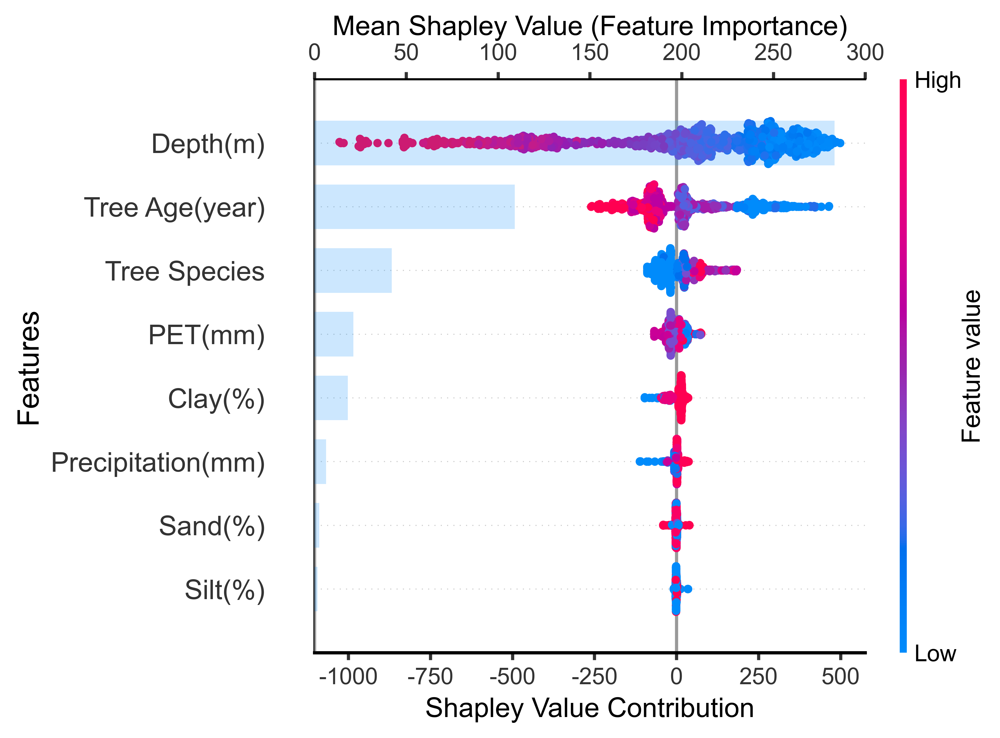

In [6]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
# 设置字体
matplotlib.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# === 读取并处理数据 ===
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
rawdata2_row = np.size(rawdata2, 0)

err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    site_row = df.shape[0]
    for j in range(site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
x = err.iloc[:, 1:11]
y = -err.iloc[:, 0]

# 特征命名
feature_name_map = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree Species',
    9: 'Longitude',
    10:'Latitude'
}
x = x.rename(columns=feature_name_map)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

# 拆分数据
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# 训练模型
rfr = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)

rfr.fit(X_train, Y_train)

# SHAP值计算
explainer = shap.TreeExplainer(rfr)
shap_values = explainer.shap_values(X_test)

# === 绘图 ===
plt.figure(figsize=(9, 6), dpi=600)  
#fig, ax1 = plt.subplots(figsize=(14, 8), dpi=1200)

# 主图：SHAP 蜂巢图
shap.summary_plot(shap_values, X_test, plot_type="dot", show=False, color_bar=True)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 留出右侧热力条空间
ax1 = plt.gca()  # 获取蜂巢图坐标轴

# 顶部图：SHAP 条形图（共享 y 轴）
ax2 = ax1.twiny()
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 与主图对齐
ax2.axhline(y=9, color='gray', linestyle='-', linewidth=1)  # 顶部参考线（可调整）

# 设置透明度
for bar in ax2.patches:
    bar.set_alpha(0.2)

# 设置标签
ax1.set_xlabel('Shapley Value Contribution')
# 设置边框线：上边框和左边框都设为黑色
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_linewidth(1)
ax1.spines['left'].set_color('black')
ax2.set_xlabel('Mean Shapley Value (Feature Importance)')
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()
# ✅ 显式添加上边框线
ax2.spines['top'].set_visible(True)
ax2.spines['top'].set_linewidth(1)
ax2.spines['top'].set_color('black')
ax2.set_xlim(0,300)
ax1.set_ylabel('Features', fontsize=14)
plt.tight_layout()

# 保存图像
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\SHAP\SHAP_combined_plot.pdf', format='pdf', bbox_inches='tight')
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\SHAP_combined_plot.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

### 5.1.2 Sites with Root Data (Without Root Variables)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_24732\793802114.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


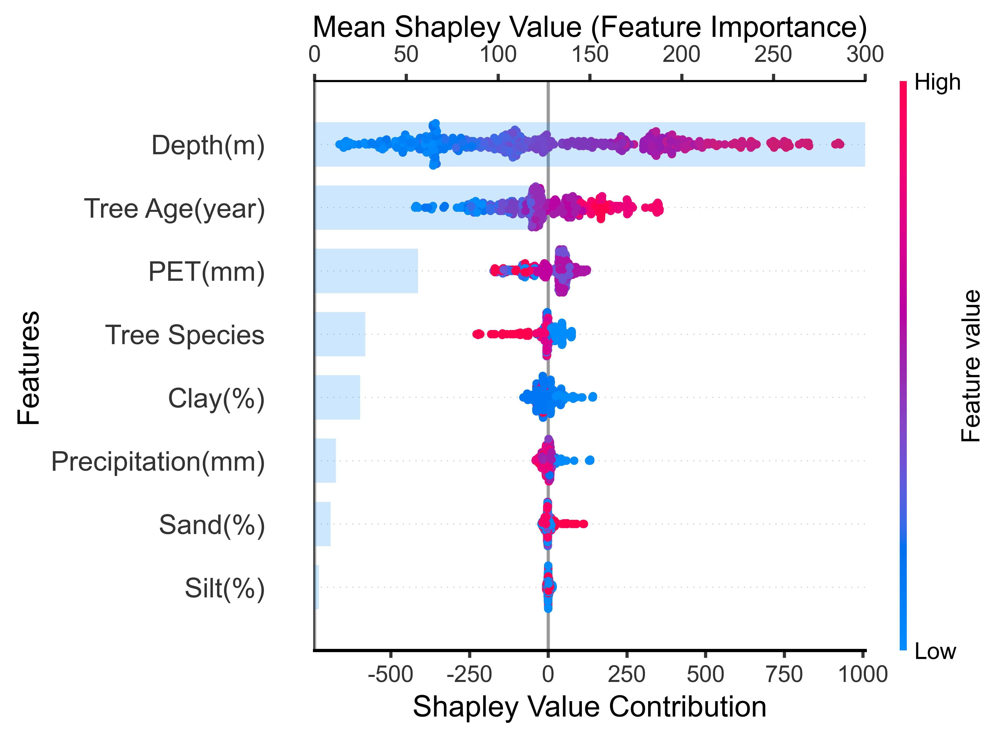

In [7]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
# 设置字体
matplotlib.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]


# 拆分数据
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# 训练模型
rfr = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)

rfr.fit(X_train, Y_train)

# SHAP值计算
explainer = shap.TreeExplainer(rfr)
shap_values = explainer.shap_values(X_test)

# === 绘图 ===
plt.figure(figsize=(9, 6), dpi=600)  
#fig, ax1 = plt.subplots(figsize=(14, 8), dpi=1200)

# 主图：SHAP 蜂巢图
shap.summary_plot(shap_values, X_test, plot_type="dot", show=False, color_bar=True)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 留出右侧热力条空间
ax1 = plt.gca()  # 获取蜂巢图坐标轴

# 顶部图：SHAP 条形图（共享 y 轴）
ax2 = ax1.twiny()
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 与主图对齐
ax2.axhline(y=9, color='gray', linestyle='-', linewidth=1)  # 顶部参考线（可调整）

# 设置透明度
for bar in ax2.patches:
    bar.set_alpha(0.2)

# 设置标签
ax1.set_xlabel('Shapley Value Contribution', fontsize=14)
# 设置边框线：上边框和左边框都设为黑色
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_linewidth(1)
ax1.spines['left'].set_color('black')
ax2.set_xlabel('Mean Shapley Value (Feature Importance)', fontsize=14)
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()
# ✅ 显式添加上边框线
ax2.spines['top'].set_visible(True)
ax2.spines['top'].set_linewidth(1)
ax2.spines['top'].set_color('black')
ax2.set_xlim(0,300)
ax1.set_ylabel('Features', fontsize=14)

plt.tight_layout()

# 保存图像
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\SHAP\SHAP_combined_plot.pdf', format='pdf', bbox_inches='tight')
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\SHAP_combined_plot_withoutroot24.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

### 5.1.3 Sites with Root Data (With Root Variables)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_24732\1082092157.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


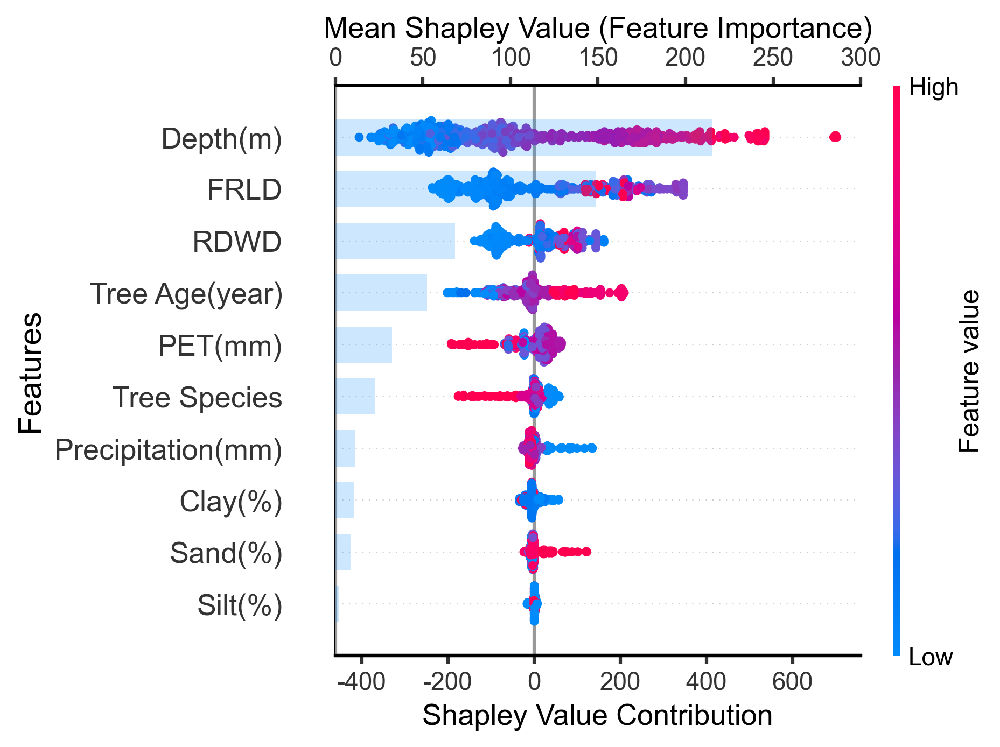

In [8]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
# 设置字体
matplotlib.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 28
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

# 拆分数据
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# 训练模型
rfr = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)

rfr.fit(X_train, Y_train)

# SHAP值计算
explainer = shap.TreeExplainer(rfr)
shap_values = explainer.shap_values(X_test)

# === 绘图 ===
plt.figure(figsize=(9, 6), dpi=300)  
#fig, ax1 = plt.subplots(figsize=(14, 8), dpi=1200)

# 主图：SHAP 蜂巢图
shap.summary_plot(shap_values, X_test, plot_type="dot", show=False, color_bar=True)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 留出右侧热力条空间
ax1 = plt.gca()  # 获取蜂巢图坐标轴

# 顶部图：SHAP 条形图（共享 y 轴）
ax2 = ax1.twiny()
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 与主图对齐
#ax2.axhline(y=9, color='gray', linestyle='-', linewidth=1)  # 顶部参考线（可调整）

# 设置透明度
for bar in ax2.patches:
    bar.set_alpha(0.2)

# 设置标签
ax1.set_xlabel('Shapley Value Contribution')
# 设置边框线：上边框和左边框都设为黑色
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_linewidth(1)
ax1.spines['left'].set_color('black')
ax2.set_xlabel('Mean Shapley Value (Feature Importance)')
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()
# ✅ 显式添加上边框线
ax2.spines['top'].set_visible(True)
ax2.spines['top'].set_linewidth(1)
ax2.spines['top'].set_color('black')
ax2.set_xlim(0,300)
ax1.set_ylabel('Features', fontsize=14)
ax1.set_position([0.2, 0.3, 0.65, 0.70])  # 主图
ax2.set_position([0.2, 0.3, 0.65, 0.70])  # 条形图
plt.tight_layout()

# 保存图像
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\SHAP\SHAP_combined_plot.pdf', format='pdf', bbox_inches='tight')
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\SHAP_combined_plot_withroot24.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

## 5.2 Individual Variable Plots

### 5.2.1 All Sites

C:\Users\Administrator\AppData\Local\Temp\ipykernel_24732\2031010867.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


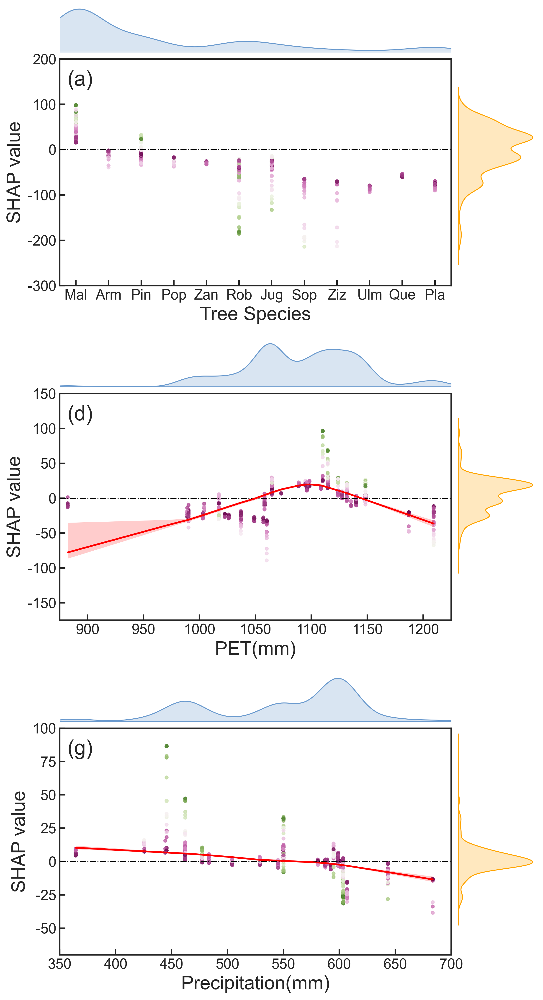

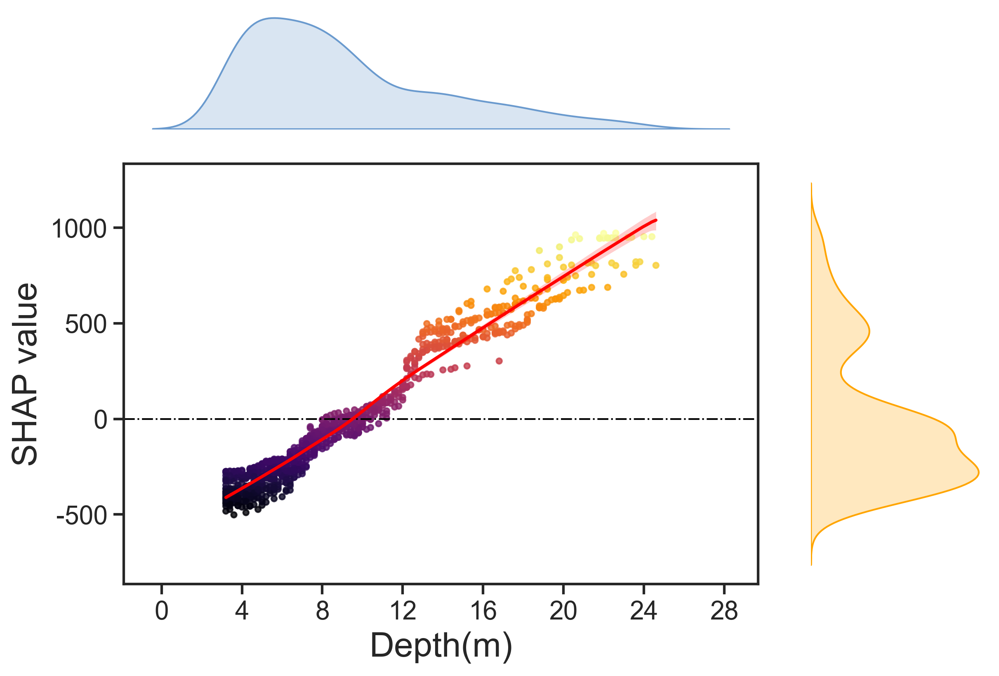

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


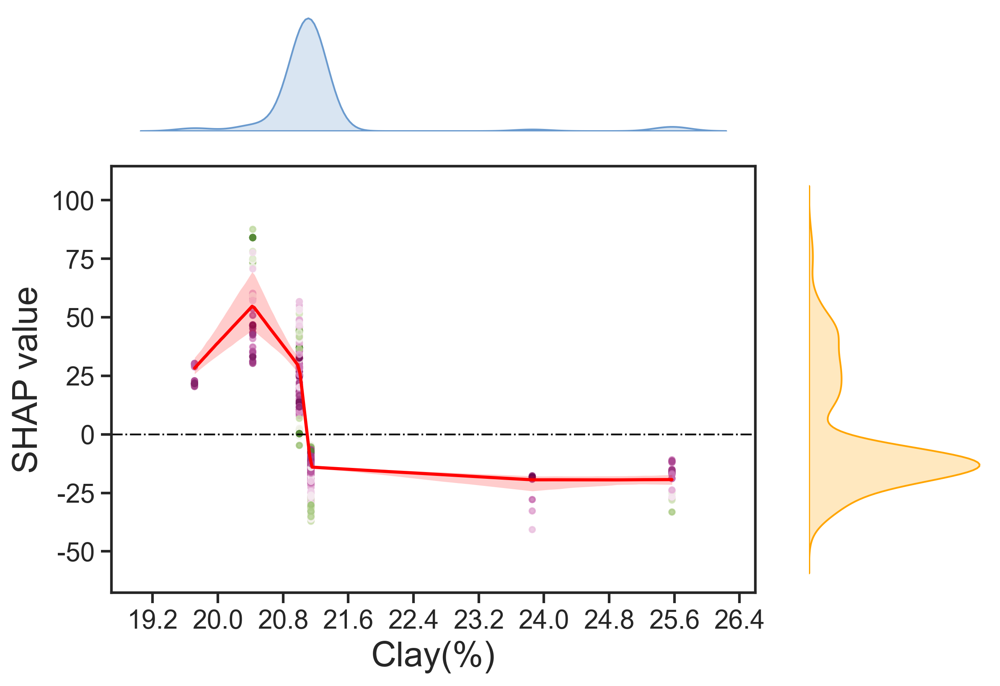

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


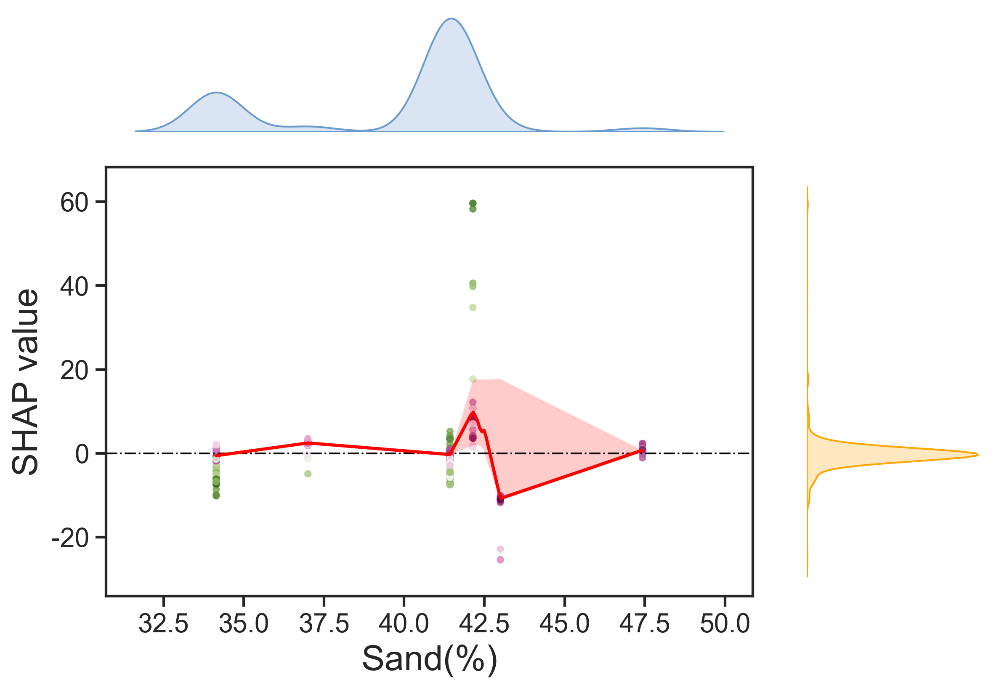

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


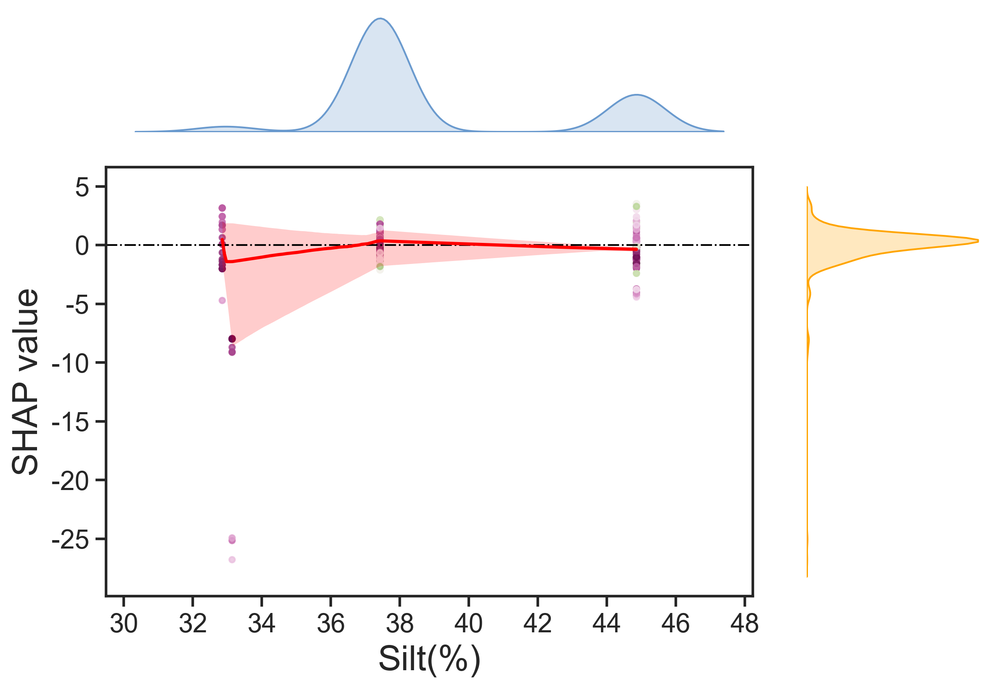

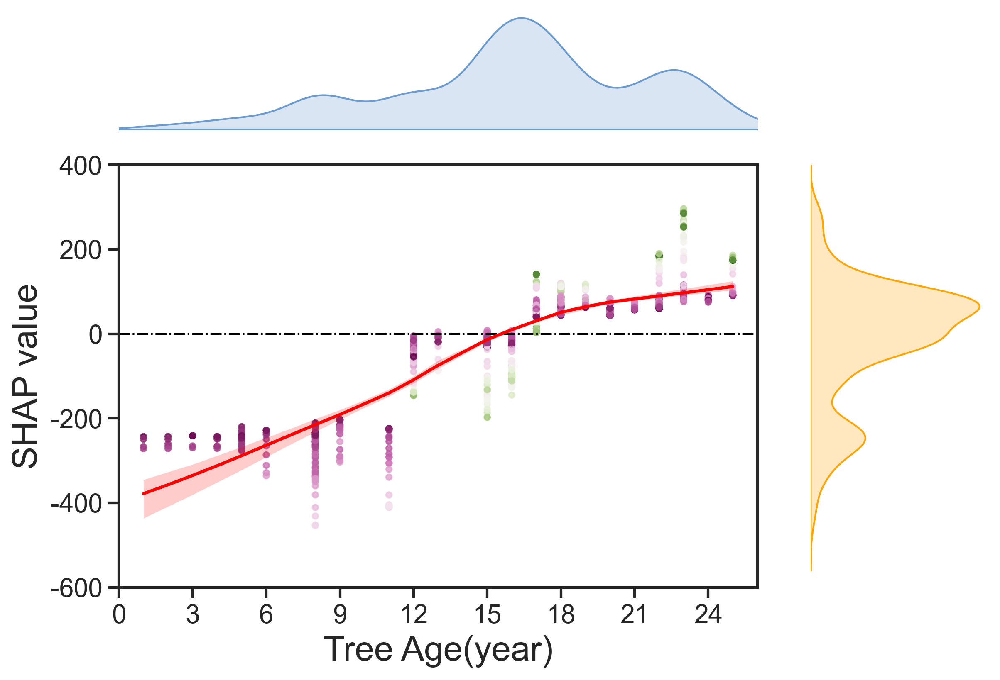

✅ 所有其他特征图已保存至：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap


In [12]:
###20250813以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
from matplotlib.ticker import MaxNLocator
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
from scipy.interpolate import UnivariateSpline
from PIL import Image, ImageDraw, ImageFont
import io
from mpl_toolkits.axes_grid1 import make_axes_locatable
red_transparent = to_rgba("red", alpha=0.15)
matplotlib.rcParams['font.family'] = 'Arial'  # 设置字体
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# === Step 1: 读取数据 ===
rawdata_path = r'C:\Users\Administrator\Desktop\AFM\data\data.csv'
rawdata2_path = r'C:\Users\Administrator\Desktop\AFM\data\data2.csv'

rawdata = pd.read_csv(rawdata_path, encoding='gbk')
rawdata2 = pd.read_csv(rawdata2_path, encoding='gbk')
rawdata2_row = rawdata2.shape[0]

err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    site_row = df.shape[0]
    for j in range(site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
x = err.iloc[:, 1:9]
y = err.iloc[:, 0]
new_feature_names = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree Species',
}
x.rename(columns=new_feature_names, inplace=True)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === Step 4: 训练随机森林回归模型 ===
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(rfr)
shap_test = explainer(x_test)
shap_df = pd.DataFrame(shap_test.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)

# === 植物种类缩写映射 ===20250826以前
#data = {
#    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
#              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
#              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Amygdalus persica L.',
#              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco', 'Ulmus pumila L.'],
#    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
#}
# === 植物种类缩写映射 ===20250826以后
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Ulmus pumila L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco' ],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 自定义 LOWESS 置信区间函数 ===
def plot_lowess_with_ci(x, y, ax, n_boot=1000, ci=95, color_line="red", frac=0.7):
    from statsmodels.nonparametric.smoothers_lowess import lowess
    from matplotlib.colors import to_rgba

    x = np.asarray(x)
    y = np.asarray(y)
    mask = ~np.isnan(x) & ~np.isnan(y)
    x = x[mask]
    y = y[mask]

    x_grid = np.linspace(x.min(), x.max(), 200)
    boot_preds = []

    for _ in range(n_boot):
        idx = np.random.choice(len(x), len(x), replace=True)
        x_sample = x[idx]
        y_sample = y[idx]

        try:
            fit = lowess(y_sample, x_sample, frac=frac, return_sorted=True)
            xp, yp = fit[:, 0], fit[:, 1]

            # 排序 + 去重（防止重复 x 导致插值错误）
            order = np.argsort(xp)
            xp = xp[order]
            yp = yp[order]
            xp_unique, indices = np.unique(xp, return_index=True)
            yp_unique = yp[indices]

            interp = np.interp(x_grid, xp_unique, yp_unique)
            boot_preds.append(interp)
        except:
            continue

    boot_preds = np.array(boot_preds)
    if boot_preds.shape[0] < 5:
        return

    low = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    high = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    median = np.median(boot_preds, axis=0)

    # zorder控制图层顺序
    ax.fill_between(x_grid, low, high, color=to_rgba(color_line, 0.2), zorder=1, linewidth=0)
    ax.plot(x_grid, median, color=color_line, lw=1.8, zorder=2)

# === 颜色映射 ===
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\bam.txt") # 假设你下载了 batlow 的 txt 文件
bam_map = LinearSegmentedColormap.from_list('bam', cm_data)
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)

# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(9, 18), dpi=300)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-175, 150),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400)
}
xaxis_limits = {
    'Tree Species': (100, 112),
    'PET(mm)': (875, 1225),
    'Precipitation(mm)': (350, 700),
    'Tree Age(year)': (0, 26)
}
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(a)', '(d)', '(g)']

# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 111.5)
        ax_main.set_xticks(np.arange(100, 112,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
#cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
#cb = fig.colorbar(scatter, cax=cbar_ax)
#cb.set_label("Depth(m)")

# 保存图像
#fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots72.png"), bbox_inches='tight', dpi=300)
plt.show()

# === 第三步：生成其余特征的独立图像 ===
other_features = [col for col in x_test.columns if col not in combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)

    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
        #cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        #cbar = plt.colorbar(scatter, cax=cbar_ax)
        #cbar.set_label('Depth(m)')
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
     #   cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
     #   cbar = plt.colorbar(scatter, cax=cbar_ax)
     #   cbar.set_label('SHAP value')

    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.xaxis.set_major_locator(MaxNLocator(integer=False))
    main_ax.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])  # ✅ 限制 y 轴范围
    if feature in xaxis_limits:
        main_ax.set_xlim(xaxis_limits[feature])
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='out')

    if feature != 'Tree Species':
        plot_lowess_with_ci(x_val, shap_val, main_ax, color_line="red")

    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    # 保存独立图
    file_name = f"SHAP_X20_site72_{feature.replace(' ', '_')}.png"
    #plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=300)
    plt.show(fig)

print(f"✅ 所有其他特征图已保存至：{save_dir}")

### 5.2.2 Sites with Root Data (Without Root Variables)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_24732\3972950952.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_24732\3972950952.py:251: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # 为 colorbar 留出空间


✅ 子图版 SHAP RDWD/FRLD 已保存：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\SHAP_RDWD_FRLD_subplot.png


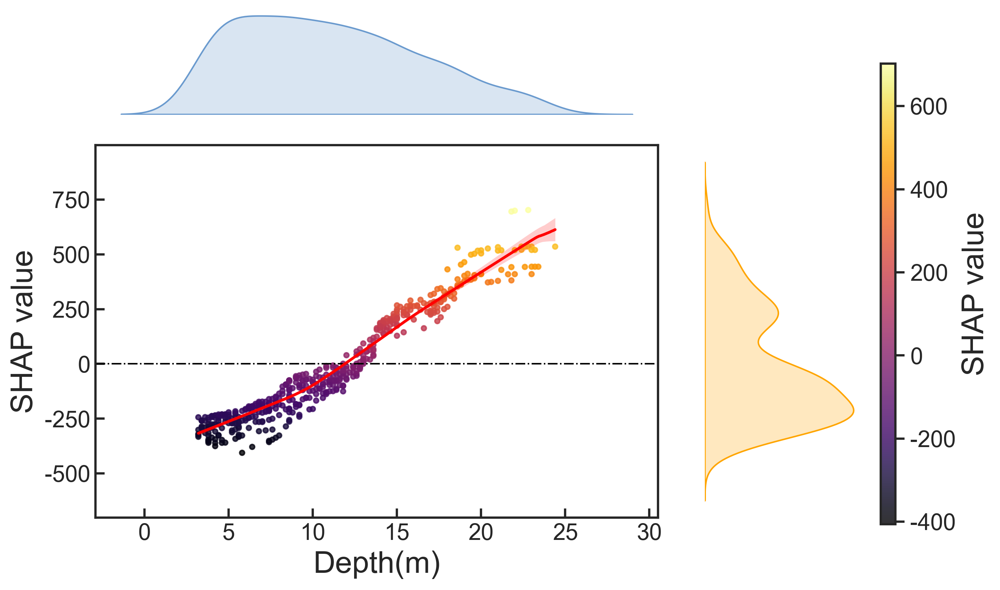

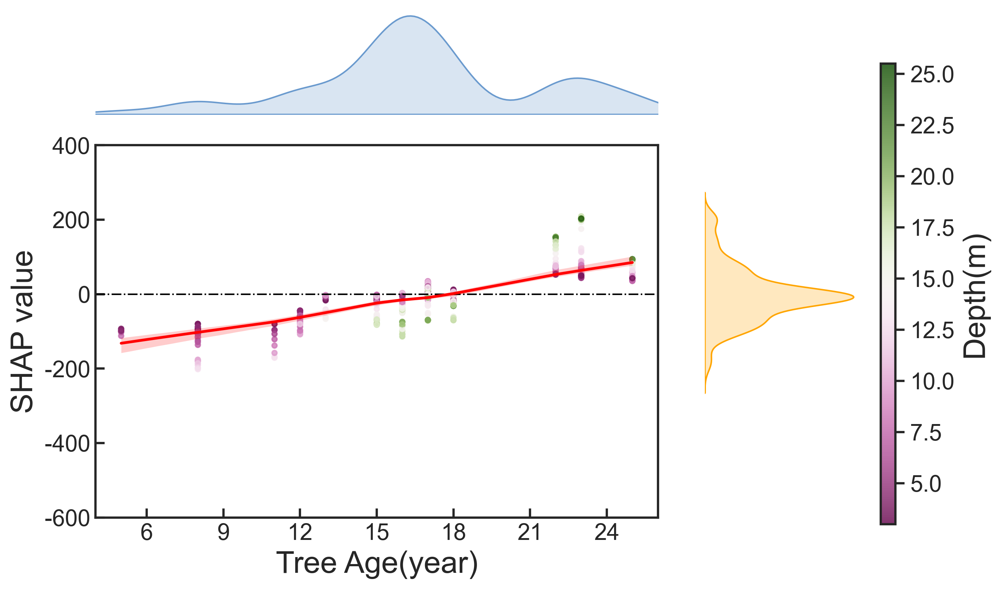

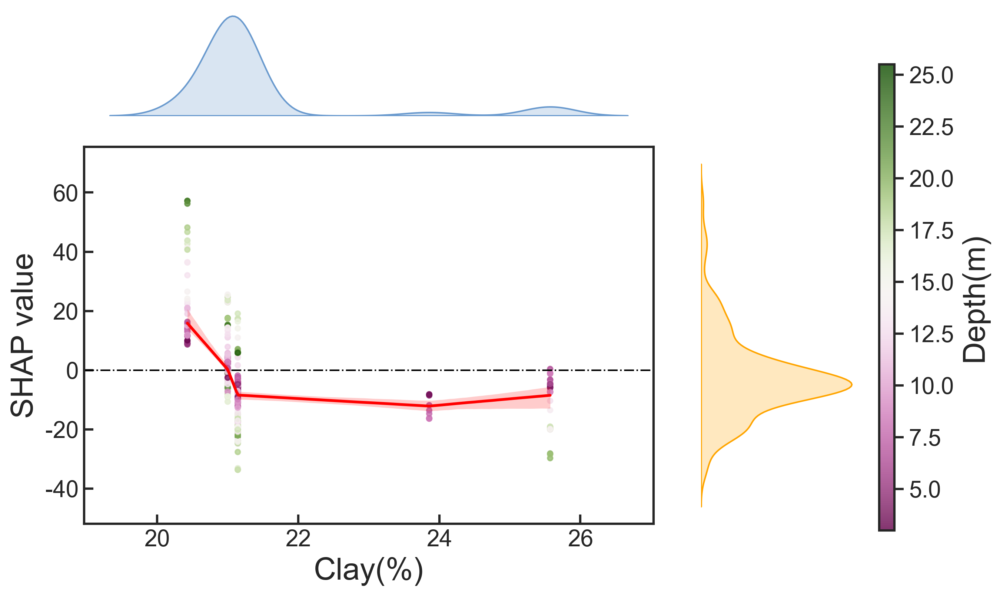

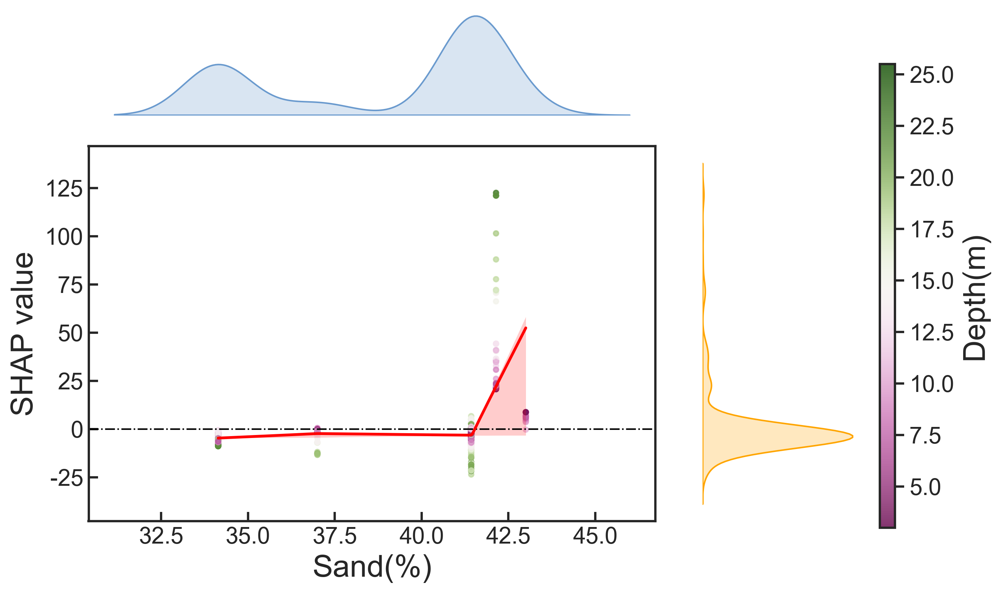

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


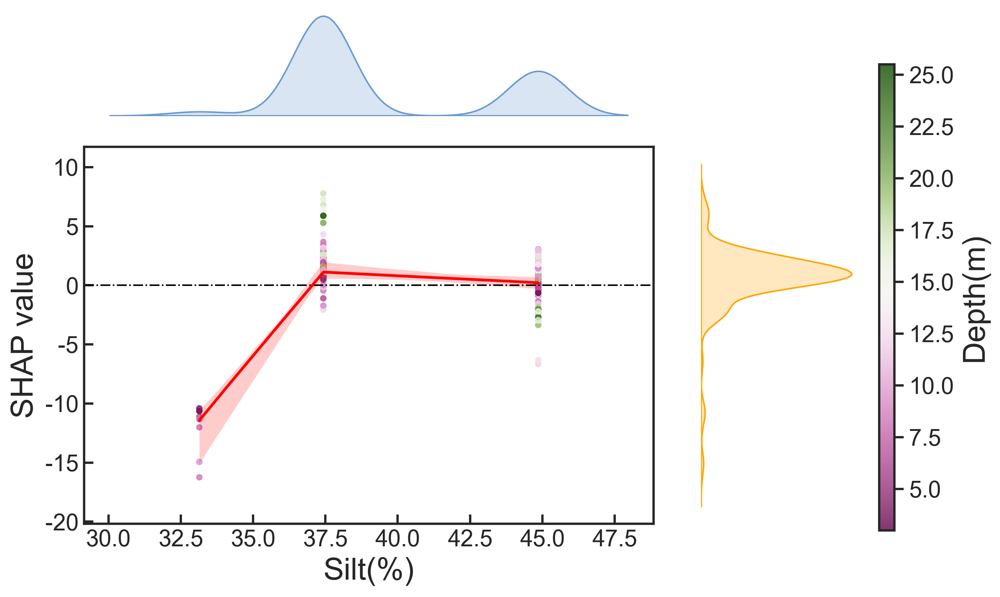

✅ 所有独立图已保存至：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap


In [13]:
### 20250813以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
import matplotlib
from matplotlib.ticker import MaxNLocator
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
from scipy.interpolate import UnivariateSpline
from PIL import Image, ImageDraw, ImageFont
import io
from mpl_toolkits.axes_grid1 import make_axes_locatable
# === 设置字体和颜色 ===
matplotlib.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
red_transparent = to_rgba("red", alpha=0.15)

def plot_lowess_with_ci(x, y, ax, n_boot=1000, ci=95, color_line="red", frac=0.7):
    from statsmodels.nonparametric.smoothers_lowess import lowess
    from matplotlib.colors import to_rgba

    x = np.asarray(x)
    y = np.asarray(y)
    mask = ~np.isnan(x) & ~np.isnan(y)
    x = x[mask]
    y = y[mask]

    x_grid = np.linspace(x.min(), x.max(), 200)
    boot_preds = []

    for _ in range(n_boot):
        idx = np.random.choice(len(x), len(x), replace=True)
        x_sample = x[idx]
        y_sample = y[idx]

        try:
            fit = lowess(y_sample, x_sample, frac=frac, return_sorted=True)
            xp, yp = fit[:, 0], fit[:, 1]

            # 排序 + 去重（防止重复 x 导致插值错误）
            order = np.argsort(xp)
            xp = xp[order]
            yp = yp[order]
            xp_unique, indices = np.unique(xp, return_index=True)
            yp_unique = yp[indices]

            interp = np.interp(x_grid, xp_unique, yp_unique)
            boot_preds.append(interp)
        except:
            continue

    boot_preds = np.array(boot_preds)
    if boot_preds.shape[0] < 5:
        return

    low = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    high = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    median = np.median(boot_preds, axis=0)

    # zorder控制图层顺序
    ax.fill_between(x_grid, low, high, color=to_rgba(color_line, 0.2), zorder=1, linewidth=0)
    ax.plot(x_grid, median, color=color_line, lw=1.8, zorder=2)
# === Step 1: 读取数据 ===
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === Step 4: 训练随机森林回归模型 ===
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(rfr)
shap_test = explainer(x_test)
shap_df = pd.DataFrame(shap_test.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)

# === 植物种类缩写映射 ===20250826以后
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Ulmus pumila L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco' ],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 颜色映射 ===
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\bam.txt") # 假设你下载了 batlow 的 txt 文件
bam_map = LinearSegmentedColormap.from_list('batlow', cm_data)
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-175, 150),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400),
    'RDWD':(-200,200),
    'FRLD':(-400,400)
}
xaxis_limits = {
    'Tree Species': (100, 112),
    'PET(mm)': (975, 1225),
    'Precipitation(mm)': (400, 700),
    'Tree Age(year)': (4, 26),
    'RDWD':(-1500,12500),
    'FRLD':(-15000,275000)
}
# ===================================
# 第一组：RDWD 和 FRLD → 1行2列
# ===================================
fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=900, gridspec_kw={'width_ratios': [1, 1]})
pair_features = ['RDWD', 'FRLD']
pair_labels = ['(a)', '(b)']

for idx, feature in enumerate(pair_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    # 科学计数法
    if feature in ['RDWD', 'FRLD']:
        from matplotlib.ticker import ScalarFormatter
        formatter = ScalarFormatter(useMathText=False)
        formatter.set_scientific(True)
        formatter.set_powerlimits((-2, 3))
        ax_main.xaxis.set_major_formatter(formatter)

    # LOWESS 平滑曲线
    plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")

    # 密度图（上）
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 密度图（右）
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签 (a), (b)
    ax_main.text(0.02, 0.95, pair_labels[idx], transform=ax_main.transAxes,
                 fontsize=22,  va='top', ha='left')#fontweight='bold',

# 公共 colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = plt.colorbar(scatter, cax=cbar_ax)
cb.set_label('Depth(m)')

plt.tight_layout(rect=[0, 0, 0.9, 1])  # 为 colorbar 留出空间

# 保存图片
save_path = os.path.join(save_dir, "SHAP_RDWD_FRLD_subplot.png")
#plt.savefig(save_path, dpi=300)
#plt.savefig(save_path.replace('.png', '.pdf'), dpi=300)
plt.show()
print(f"✅ 子图版 SHAP RDWD/FRLD 已保存：{save_path}")
# ===================================
# 第二组：Tree Species, PET, Precip → 3行1列
# ===================================
#trio_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
#trio_labels = ['(c)', '(f)', '(i)']
#trio_images = []
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(c)', '(f)', '(i)']
# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(10, 18), dpi=900)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 111.5)
        ax_main.set_xticks(np.arange(100, 112,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = fig.colorbar(scatter, cax=cbar_ax)
cb.set_label("Depth(m)")

# 保存图像
#fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots24_withroot.png"), bbox_inches='tight', dpi=300)
plt.show()
# ===================================
# 第三组：其余特征 → 独立保存
# ===================================
other_features = [col for col in x_test.columns if col not in pair_features + combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)
    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('Depth(m)')
        # 设置稀疏的颜色条刻度
        #tick_values = np.linspace(np.nanmin(color_feature), np.nanmax(color_feature), num=5)
        #cbar.set_ticks(tick_values)
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('SHAP value')
        # 设置稀疏的颜色条刻度
        #tick_values = np.linspace(np.nanmin(color_feature), np.nanmax(color_feature), num=5)
        #cbar.set_ticks(tick_values)
    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        main_ax.set_xlim(xaxis_limits[feature])
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='in')

    if feature != 'Tree Species':
        plot_lowess_with_ci(x_val, shap_val, main_ax, color_line="red")
    if feature == 'Tree Age(year)':
        from matplotlib.ticker import MaxNLocator
        main_ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    file_name = f"SHAP_X20_site24withroot_{feature.replace(' ', '_')}.png"
    #plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=dpi)
    plt.show(fig)

print(f"✅ 所有独立图已保存至：{save_dir}")

### 5.2.3 Sites with Root Data (With Root Variables)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_24732\3136542600.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


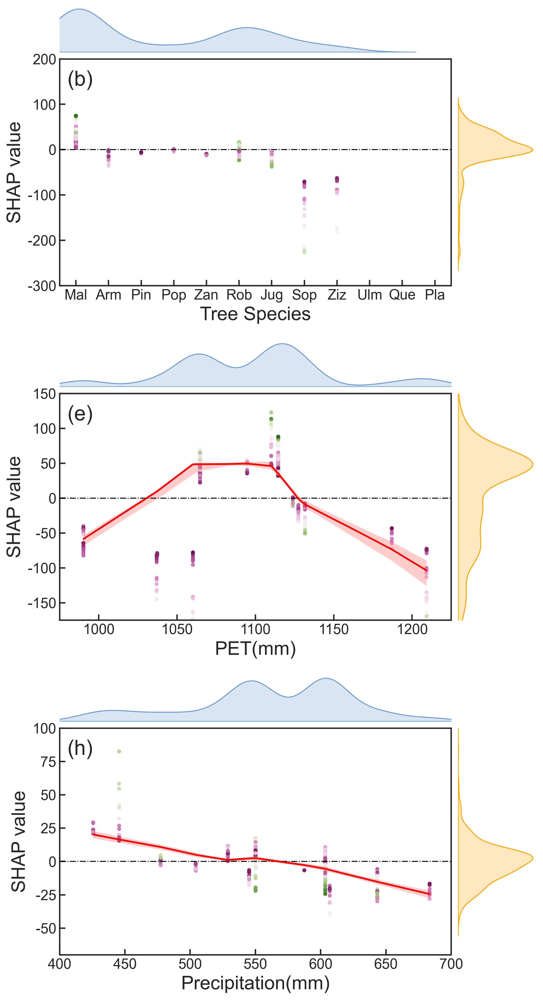

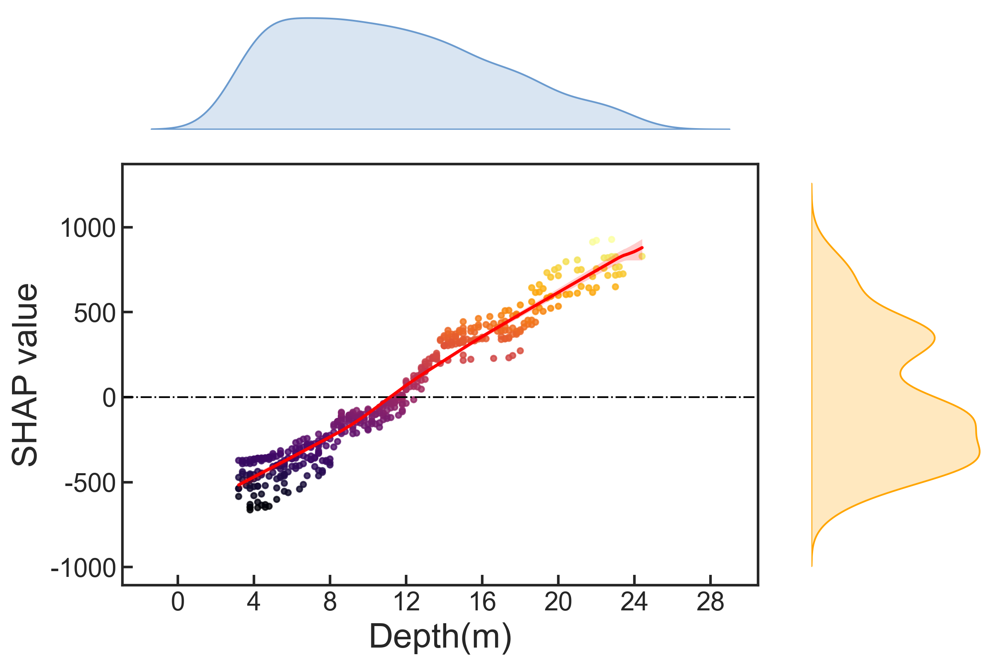

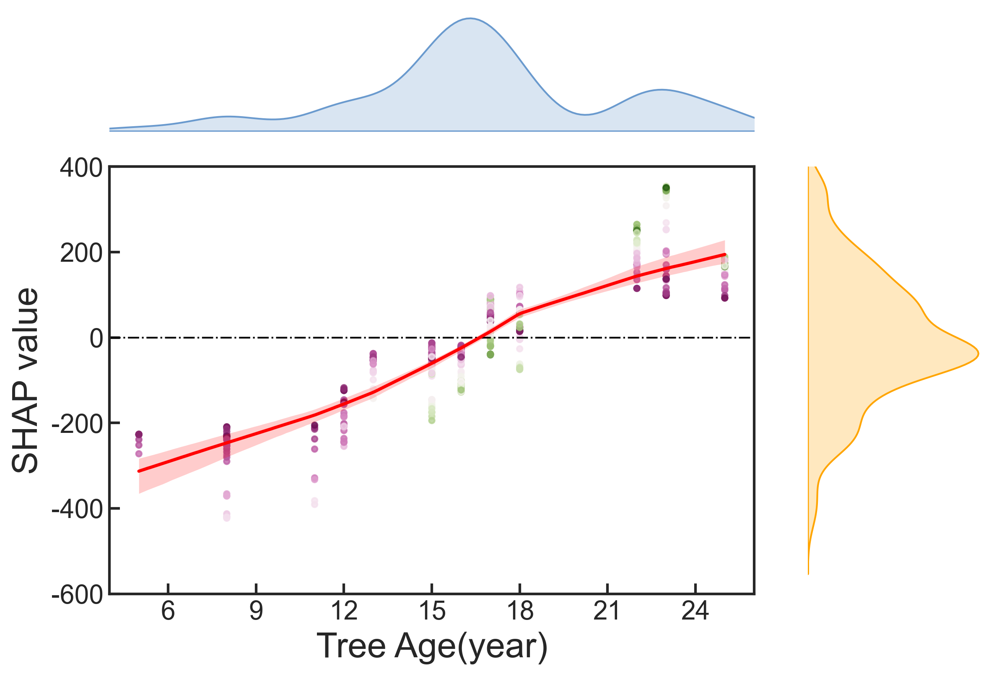

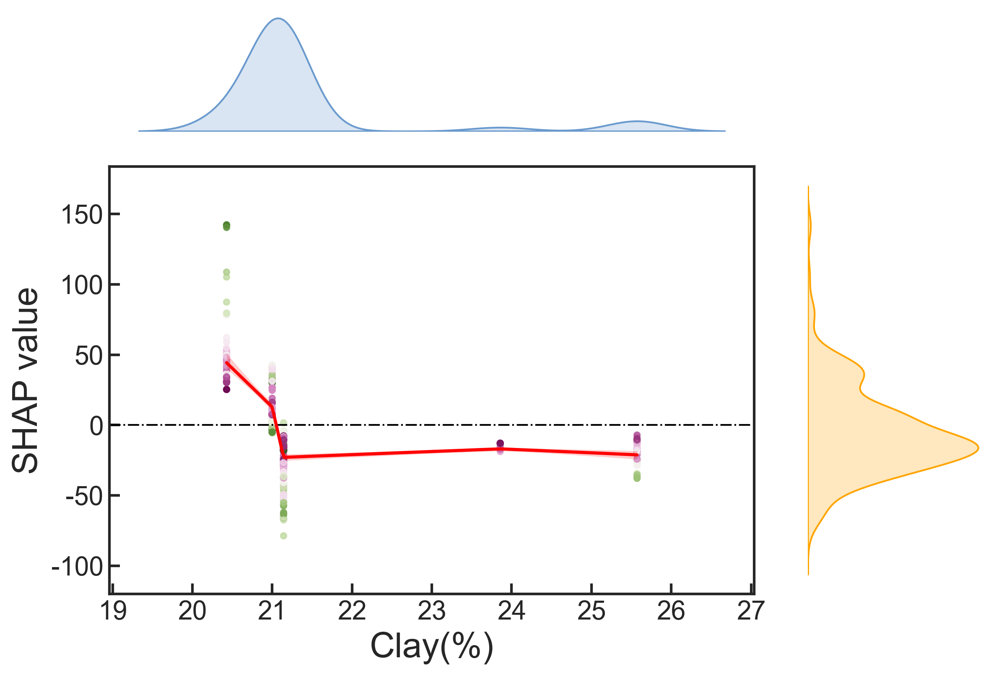

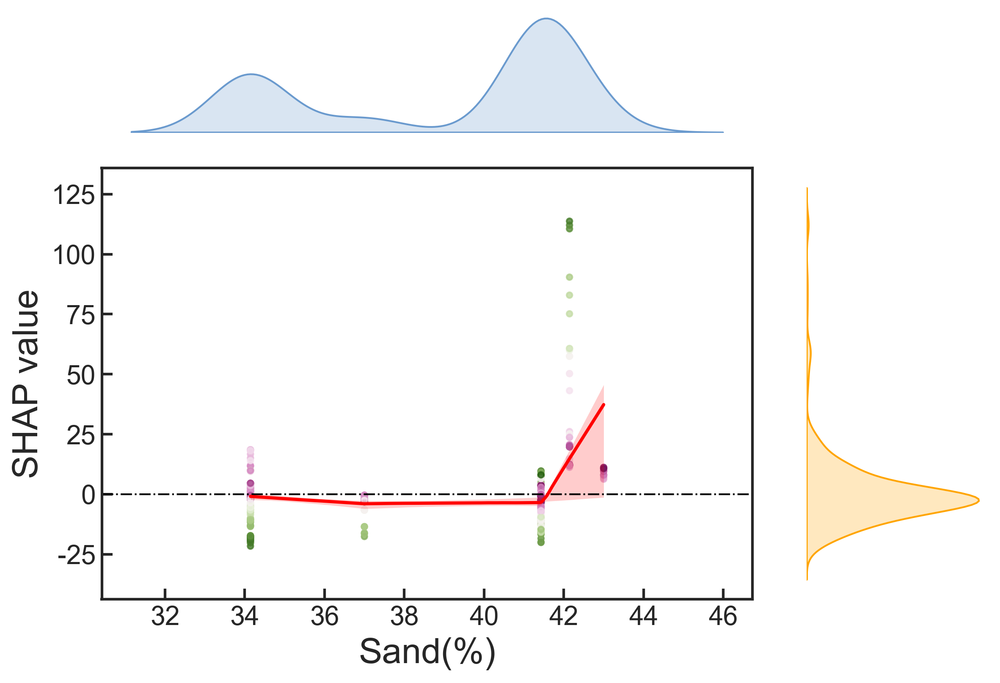

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


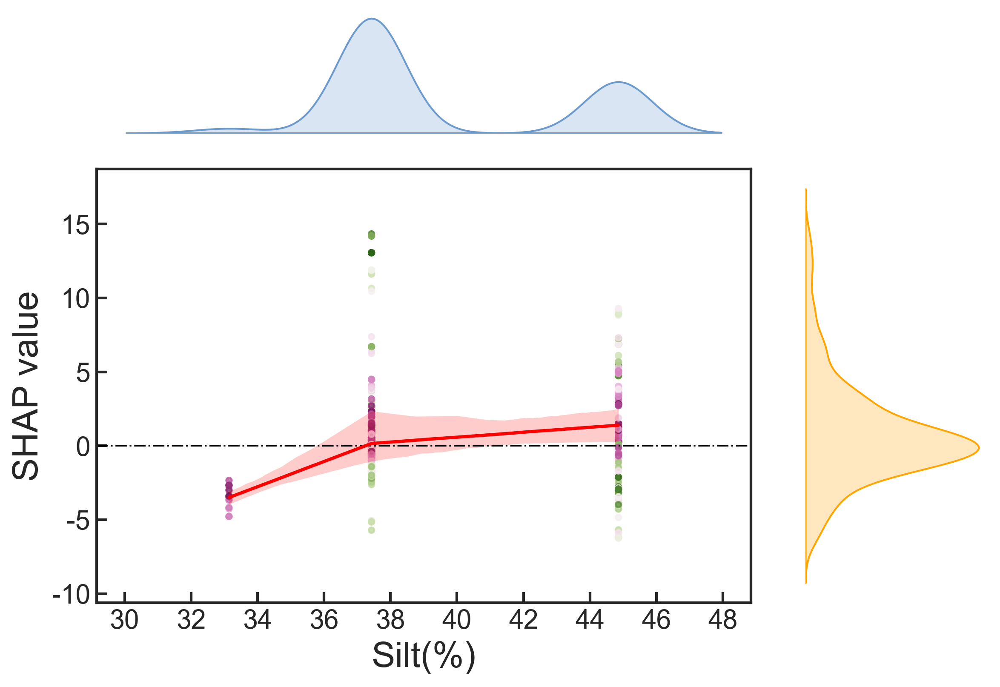

✅ 所有其他特征图已保存至：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap


In [14]:
###20250813以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
import matplotlib
from matplotlib.ticker import MaxNLocator  
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
red_transparent = to_rgba("red", alpha=0.15)
from scipy.interpolate import UnivariateSpline
import io
from PIL import Image, ImageDraw, ImageFont
from mpl_toolkits.axes_grid1 import make_axes_locatable
matplotlib.rcParams['font.family'] = 'Arial'  # 设置字体
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# === Step 1: 读取数据 ===
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === Step 4: 训练随机森林回归模型 ===
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(rfr)
shap_test = explainer(x_test)
shap_df = pd.DataFrame(shap_test.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)

# === 植物种类缩写映射 ===20250826以后
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Ulmus pumila L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco' ],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 自定义 LOWESS 置信区间函数 ===
def plot_lowess_with_ci(x, y, ax, n_boot=1000, ci=95, color_line="red", frac=0.7):
    from statsmodels.nonparametric.smoothers_lowess import lowess
    from matplotlib.colors import to_rgba

    x = np.asarray(x)
    y = np.asarray(y)
    mask = ~np.isnan(x) & ~np.isnan(y)
    x = x[mask]
    y = y[mask]

    x_grid = np.linspace(x.min(), x.max(), 200)
    boot_preds = []

    for _ in range(n_boot):
        idx = np.random.choice(len(x), len(x), replace=True)
        x_sample = x[idx]
        y_sample = y[idx]

        try:
            fit = lowess(y_sample, x_sample, frac=frac, return_sorted=True)
            xp, yp = fit[:, 0], fit[:, 1]

            # 排序 + 去重（防止重复 x 导致插值错误）
            order = np.argsort(xp)
            xp = xp[order]
            yp = yp[order]
            xp_unique, indices = np.unique(xp, return_index=True)
            yp_unique = yp[indices]

            interp = np.interp(x_grid, xp_unique, yp_unique)
            boot_preds.append(interp)
        except:
            continue

    boot_preds = np.array(boot_preds)
    if boot_preds.shape[0] < 5:
        return

    low = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    high = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    median = np.median(boot_preds, axis=0)

    # zorder控制图层顺序
    ax.fill_between(x_grid, low, high, color=to_rgba(color_line, 0.2), zorder=1, linewidth=0)
    ax.plot(x_grid, median, color=color_line, lw=1.8, zorder=2)

# === 颜色映射 ===
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\bam.txt") # 假设你下载了 batlow 的 txt 文件
bam_map = LinearSegmentedColormap.from_list('batlow', cm_data)
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)

# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(9, 18), dpi=300)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-175, 150),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400)
}
xaxis_limits = {
    'Tree Species': (100, 112),
    'PET(mm)': (975, 1225),
    'Precipitation(mm)': (400, 700),
    'Tree Age(year)': (4, 26)
}
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(b)', '(e)', '(h)']

# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')
    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 111.5)
        ax_main.set_xticks(np.arange(100, 112,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
#cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
#cb = fig.colorbar(scatter, cax=cbar_ax)
#cb.set_label("Depth(m)")

# 保存图像
#fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots24_withoutroot.png"), bbox_inches='tight', dpi=300)
plt.show()

# === 第三步：生成其余特征的独立图像 ===
other_features = [col for col in x_test.columns if col not in combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)

    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
        #cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        #cbar = plt.colorbar(scatter, cax=cbar_ax)
        #cbar.set_label('Depth(m)')
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
   #     cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
   #     cbar = plt.colorbar(scatter, cax=cbar_ax)
   #     cbar.set_label('SHAP value')
    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.xaxis.set_major_locator(MaxNLocator(integer=False))
    main_ax.set_ylabel("SHAP value")
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        main_ax.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        plot_lowess_with_ci(x_val, shap_val, main_ax, color_line="red")
    # 如果是树龄，想用整数刻度可加：
    if feature == 'Tree Age(year)':
        from matplotlib.ticker import MaxNLocator
        main_ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    # 保存独立图
    file_name = f"SHAP_X20_site24_withoutroot_{feature.replace(' ', '_')}.png"
    #plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=dpi)
    plt.show(fig)

print(f"✅ 所有其他特征图已保存至：{save_dir}")

## 5.3 Interaction Between Two Factors

正在计算 SHAP 交互值...


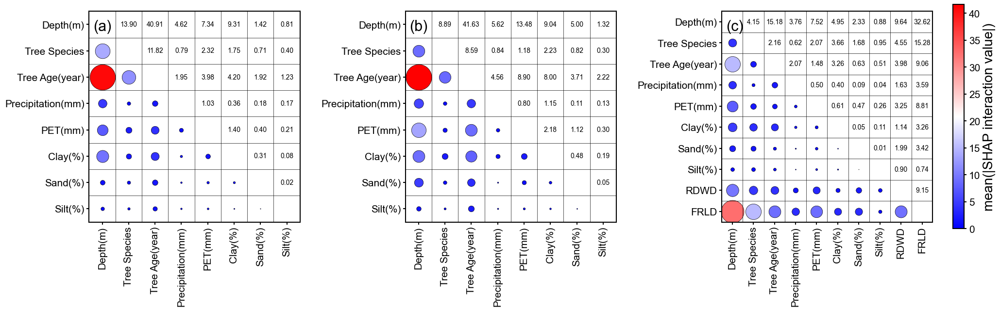

✅ 图像已保存至：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\shap_interaction_1x3_combined.png


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
import shap
import os
plt.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# ====== 模型1 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x1 = err.iloc[:, 1:11]
y1 = -err.iloc[:, 0]

# 特征命名
feature_name_map = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree Species',
    9: 'Longitude',
    10:'Latitude'
}
x1 = x1.rename(columns=feature_name_map)
x1 = x1[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(x1, y1, test_size=0.3, random_state=42)
rfr1 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr1.fit(X_train1, Y_train1)

# ====== 模型2 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv', encoding='gbk')
err = np.empty((0, 20))
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 20)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x2 = err.iloc[:, 1:20]
y2 = err.iloc[:, 0]

rename_map = {
    1: 'Depth(m)',
    2:'RDWD',
    3:'FRLD',
    4:'Tree Species',
    5:'Latitude',
    6:'Longitude',
    7:'Tree Age(year)',
    8:'P(mm yr-1)',
    9:'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}
x2 = x2.rename(columns=rename_map)         # inplace=False，重新赋值
sel_cols_base = ['Depth(m)', 'Tree Species','Tree Age(year)',
                 'Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']
x2 = x2[sel_cols_base]
X_train2, X_test2, Y_train2, Y_test2 = train_test_split(x2, y2, test_size=0.3, random_state=42)
rfr2 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr2.fit(X_train2, Y_train2)

# ====== 模型3（你可以复制模型2再换一套变量，比如增加 Root Dry Weight 和 Fine Root Length）======
x3 = err.iloc[:, 1:20].copy()
y3 = err.iloc[:, 0]
x3=x3.rename(columns=rename_map)
x3 = x3[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)', 'RDWD','FRLD']]
X_train3, X_test3, Y_train3, Y_test3 = train_test_split(x3, y3, test_size=0.3, random_state=42)
rfr3 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr3.fit(X_train3, Y_train3)
# === 计算 SHAP 交互作用值 ===
print("正在计算 SHAP 交互值...")
explainer1 = shap.TreeExplainer(rfr1)
shap_interaction1 = explainer1.shap_interaction_values(X_test1)
mean_inter1 = np.abs(shap_interaction1).mean(axis=0)

explainer2 = shap.TreeExplainer(rfr2)
shap_interaction2 = explainer2.shap_interaction_values(X_test2)
mean_inter2 = np.abs(shap_interaction2).mean(axis=0)

explainer3 = shap.TreeExplainer(rfr3)
shap_interaction3 = explainer3.shap_interaction_values(X_test3)
mean_inter3 = np.abs(shap_interaction3).mean(axis=0)

# 共享 colorbar 范围
def get_lower_triangle_max(matrix):
    return np.max(np.tril(matrix, k=-1))  # 只取下三角，不包括对角线

vmax1 = get_lower_triangle_max(mean_inter1)
vmax2 = get_lower_triangle_max(mean_inter2)
vmax3 = get_lower_triangle_max(mean_inter3)

vmax = max(vmax1, vmax2, vmax3)  # 真正可视部分的最大值
#vmax = max(mean_inter1.max(), mean_inter2.max(), mean_inter3.max())
norm = plt.Normalize(vmin=0, vmax=vmax)
cmap = 'bwr'#'seismic'

# === 绘制 1x3 子图 ===
fig, axes = plt.subplots(1, 3, figsize=(27, 6))  # 宽图
fig.subplots_adjust(wspace=0.5)

features_list = [X_test1.columns, X_test2.columns, X_test3.columns]
inter_list = [mean_inter1, mean_inter2, mean_inter3]

for idx in range(3):
    ax = axes[idx]
    features = features_list[idx]
    mean_inter = inter_list[idx]
    n = len(features)

    ax.set_xlim(-0.5, n - 0.5)
    ax.set_ylim(-0.5, n - 0.5)
    ax.set_aspect('equal')

    # === 热力图绘制逻辑 ===
    for i in range(n):
        for j in range(n):
            val = mean_inter[i, j]
            row =n-1-i  # 翻转y轴
            col = j
            if i > j:
                # 下三角：圆圈表示交互值
                ax.scatter(col, row, s=35*val, c=[val], cmap=cmap,
                           vmin=0, vmax=vmax, edgecolors='black', linewidth=0.5)
            elif i < j:
                # 上三角：写数字
                ax.text(col, row, f"{val:.2f}", ha='center', va='center', fontsize=10)
         #   else:
         #       # 对角线：写变量名
         #       ax.text(col, row, features[i], ha='center', va='center',
         #               fontsize=8, fontweight='bold')
    # 设置坐标轴
    ax.set_xticks(range(n))
    ax.set_xticklabels(features, rotation=90)
    ax.set_yticks(range(n))
    ax.set_yticklabels(features[::-1])
    ax.grid(False)

    # 添加格网边框
    for i in range(n + 1):
        ax.axhline(i - 0.5, color='black', linewidth=0.5)
        ax.axvline(i - 0.5, color='black', linewidth=0.5)

    # 添加小图注标题
    #ax.set_title(titles[idx], fontsize=18)

    # 标注 (a) (b) (c)
    ax.text(0.02, 0.96, f'({chr(97 + idx)})', transform=ax.transAxes,
            va='top', ha='left', color='black', fontsize=22)#, fontweight='bold'
# === 添加共享 colorbar ===
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, location='right', shrink=1, pad=0.02)
cbar.set_label('mean(|SHAP interaction value|)')#, fontsize=label_fontsize
cbar.ax.tick_params()#labelsize=tick_fontsize

# === 保存图像 ===
save_path = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\shap_interaction_1x3_combined.png'
os.makedirs(os.path.dirname(save_path), exist_ok=True)
#plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"✅ 图像已保存至：{save_path}")

# 6.Feature Importance — Random Forest

## 6.1 Importance Calculation

### 6.1.1 All Sites

In [ ]:
# m每层累计值 和直到最大层，如3.3-3.7，3.3-25.1
import pandas as pd
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
# === 读取并处理数据 ===
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
rawdata2_row = np.size(rawdata2, 0)

err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    site_row = df.shape[0]
    for j in range(site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
x = err.iloc[:, 1:9]
y = -err.iloc[:, 0]

# 特征命名
new_feature_names = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree Species'
}

# 初始化一个空的DataFrame来保存所有深度的结果
results = pd.DataFrame()

for depth in np.arange(3.2, 25.4, 0.2):
    # 筛选出对应深度范围的数据
    depth_data = err[(err.iloc[:, 1] >= 3.2) & (err.iloc[:, 1] <= depth)]
    
    # 确保每个深度的数据行数大于等于20
    if len(depth_data) >= 20:
        X = depth_data.iloc[:, 1:9]
        Y = -depth_data.iloc[:, 0]

        # 重命名列
        X.rename(columns=new_feature_names, inplace=True)

        importances_list = []

        # 进行 100 次划分
        for _ in range(100):
            X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=np.random.randint(0, 10000))
            
            rfr = RandomForestRegressor(
                random_state=42,
                n_estimators=60,
                max_features=4,
                min_samples_leaf=1,
                min_samples_split=2,
                max_depth=5
            )
            rfr.fit(X_train, Y_train)

            importances_list.append(rfr.feature_importances_)

        # 计算均值和标准差
        importances_mean = np.mean(importances_list, axis=0)
        importances_std = np.std(importances_list, axis=0)

        # 构建结果行
        result_row = pd.DataFrame([importances_mean], columns=[f'{col}_mean' for col in X.columns])
        result_row[[f'{col}_std' for col in X.columns]] = [importances_std]
        result_row['Depth(m)'] = depth  # 添加当前最大深度

        # 合并到总结果中
        results = pd.concat([results, result_row], ignore_index=True)

# 导出结果
results.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance71.xlsx', index=False)

### 6.1.2 Sites with Root Data (Without Root Variables)

In [ ]:
#root
# m每层累计值 和直到最大层，如3.3-3.7，3.3-25.1
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
from sklearn.inspection import PartialDependenceDisplay
from sklearn.tree import export_graphviz
import shap
import os

# Set default font to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'Root Dry Weight Density',
    3: 'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
# 分割数据集为训练集和测试集

# 初始化一个空的DataFrame来保存所有深度的结果
results = pd.DataFrame()

x_all = x.copy()

for depth in np.arange(3.2, 25.4, 0.2):
    # 每次循环都基于完整数据筛选，不要累计切片
    x_sub = x_all[(x_all.iloc[:, 0] >= 3.2) & (x_all.iloc[:, 0] <= depth)]
    y_sub = err[(err.iloc[:, 1] >= 3.2) & (err.iloc[:, 1] <= depth)].iloc[:, 0]
    
    if len(x_sub) >= 20 and len(y_sub) == len(x_sub):
        X = x_sub.iloc[:, 0:8]
        Y = -y_sub  # 深度取负号是你自己的设定
        

        # 重命名列
       # X.rename(columns=new_feature_names, inplace=True)

        importances_list = []

        # 进行 100 次划分
        for _ in range(100):
            X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=np.random.randint(0, 10000))
            
            rfr = RandomForestRegressor(
                random_state=42,
                n_estimators=60,
                max_features=4,
                min_samples_leaf=1,
                min_samples_split=2,
                max_depth=5
            )
            rfr.fit(X_train, Y_train)

            importances_list.append(rfr.feature_importances_)

        # 计算均值和标准差
        importances_mean = np.mean(importances_list, axis=0)
        importances_std = np.std(importances_list, axis=0)

        # 构建结果行
        result_row = pd.DataFrame([importances_mean], columns=[f'{col}_mean' for col in X.columns])
        result_row[[f'{col}_std' for col in X.columns]] = [importances_std]
        result_row['Depth(m)'] = depth  # 添加当前最大深度

        # 合并到总结果中
        results = pd.concat([results, result_row], ignore_index=True)

# 导出结果
results.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance75.xlsx', index=False)

### 6.1.3 Sites with Root Data (With Root Variables)

In [ ]:
#root
# m每层累计值 和直到最大层，如3.3-3.7，3.3-25.1
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
from sklearn.inspection import PartialDependenceDisplay
from sklearn.tree import export_graphviz
import shap
import os

# Set default font to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2:'RDWD',
    3:'FRLD',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
# 分割数据集为训练集和测试集

# 初始化一个空的DataFrame来保存所有深度的结果
results = pd.DataFrame()

x_all = x.copy()

for depth in np.arange(3.2, 25.4, 0.2):
    # 每次循环都基于完整数据筛选，不要累计切片
    x_sub = x_all[(x_all.iloc[:, 0] >= 3.2) & (x_all.iloc[:, 0] <= depth)]
    y_sub = err[(err.iloc[:, 1] >= 3.2) & (err.iloc[:, 1] <= depth)].iloc[:, 0]
    
    if len(x_sub) >= 20 and len(y_sub) == len(x_sub):
        X = x_sub.iloc[:, 0:10]
        Y = -y_sub  # 深度取负号是你自己的设定
        

        # 重命名列
       # X.rename(columns=new_feature_names, inplace=True)

        importances_list = []

        # 进行 100 次划分
        for _ in range(100):
            X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=np.random.randint(0, 10000))
            
            rfr = RandomForestRegressor(
                random_state=42,
                n_estimators=60,
                max_features=4,
                min_samples_leaf=1,
                min_samples_split=2,
                max_depth=5
            )
            rfr.fit(X_train, Y_train)

            importances_list.append(rfr.feature_importances_)

        # 计算均值和标准差
        importances_mean = np.mean(importances_list, axis=0)
        importances_std = np.std(importances_list, axis=0)

        # 构建结果行
        result_row = pd.DataFrame([importances_mean], columns=[f'{col}_mean' for col in X.columns])
        result_row[[f'{col}_std' for col in X.columns]] = [importances_std]
        result_row['Depth(m)'] = depth  # 添加当前最大深度

        # 合并到总结果中
        results = pd.concat([results, result_row], ignore_index=True)

# 导出结果
results.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance73.xlsx', index=False)

## 6.2 Importance Plots

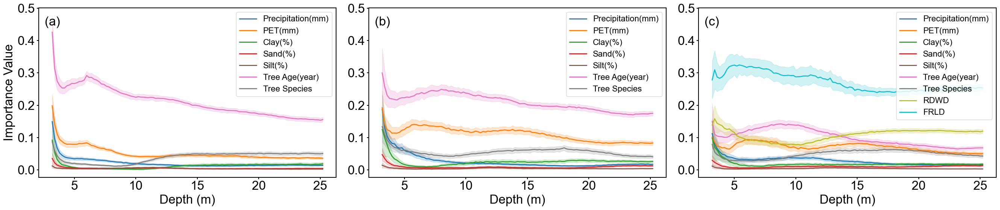

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5

# === 三个文件路径 ===
file_noroot    = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance71.xlsx'
file_root      = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance73.xlsx'
file_noroot_24 = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance75.xlsx'  # 新文件

# === 读取数据 ===
df_noroot = pd.read_excel(file_noroot)
df_root  = pd.read_excel(file_root)
df_noroot24 = pd.read_excel(file_noroot_24)

# === 定义变量列 ===
vars_noroot = [
    'Precipitation(mm)_mean','PET(mm)_mean',
    'Clay(%)_mean','Sand(%)_mean','Silt(%)_mean',
    'Tree Age(year)_mean','Tree Species_mean'
]
stds_noroot = [
    'Precipitation(mm)_std','PET(mm)_std',
    'Clay(%)_std','Sand(%)_std','Silt(%)_std',
    'Tree Age(year)_std','Tree Species_std'
]

vars_root = [
    'Precipitation(mm)_mean','PET(mm)_mean',
    'Clay(%)_mean','Sand(%)_mean','Silt(%)_mean',
    'Tree Age(year)_mean','Tree Species_mean',
    'RDWD_mean','FRLD_mean'
]
stds_root = [
    'Precipitation(mm)_std','PET(mm)_std',
    'Clay(%)_std','Sand(%)_std','Silt(%)_std',
    'Tree Age(year)_std','Tree Species_std',
    'RDWD_std','FRLD_std'
]

vars_noroot24 = vars_noroot
stds_noroot24 = stds_noroot

# === 创建 1×3 子图 ===
fig, axes = plt.subplots(1, 3, figsize=(27, 6), sharey=True)
plt.subplots_adjust(wspace=0.3)

# 子图元组：(df, vars, stds, ax, title, tag)
plot_items = [
    (df_noroot, vars_noroot, stds_noroot, axes[0], '', '(a)'),
    (df_noroot24, vars_noroot24, stds_noroot24, axes[1], '', '(b)'),
    (df_root, vars_root, stds_root, axes[2], '', '(c)')
    
]

# 使用 tab10 调色板
colors = plt.cm.tab10(np.linspace(0, 1, len(vars_root)))  # 生成 tab10 的颜色

for df, var_list, std_list, ax, title, tag in plot_items:
    depth = df['Depth(m)']
    for j, (m, s) in enumerate(zip(var_list, std_list)):
        mean = df[m]
        std = df[s]
        ax.plot(depth, mean, label=m.replace('_mean', ''), color=colors[j], linewidth=2)  # 使用 tab10 颜色
        ax.fill_between(depth, mean - std, mean + std, color=colors[j], alpha=0.2)  # 使用 tab10 颜色
    ax.set_xlabel('Depth (m)')
    ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='out')
    ax.text(0.02, 0.95, tag, transform=ax.transAxes,
            fontsize=24, va='top', ha='left')
    if ax == axes[0]:
        ax.set_ylabel('Importance Value')
    ax.legend(loc='upper right', fontsize=16)

# === 保存与展示 ===
save_path = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_Variable_Trends_3col.png'
plt.tight_layout()
#plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

# 7.Root Density Plots

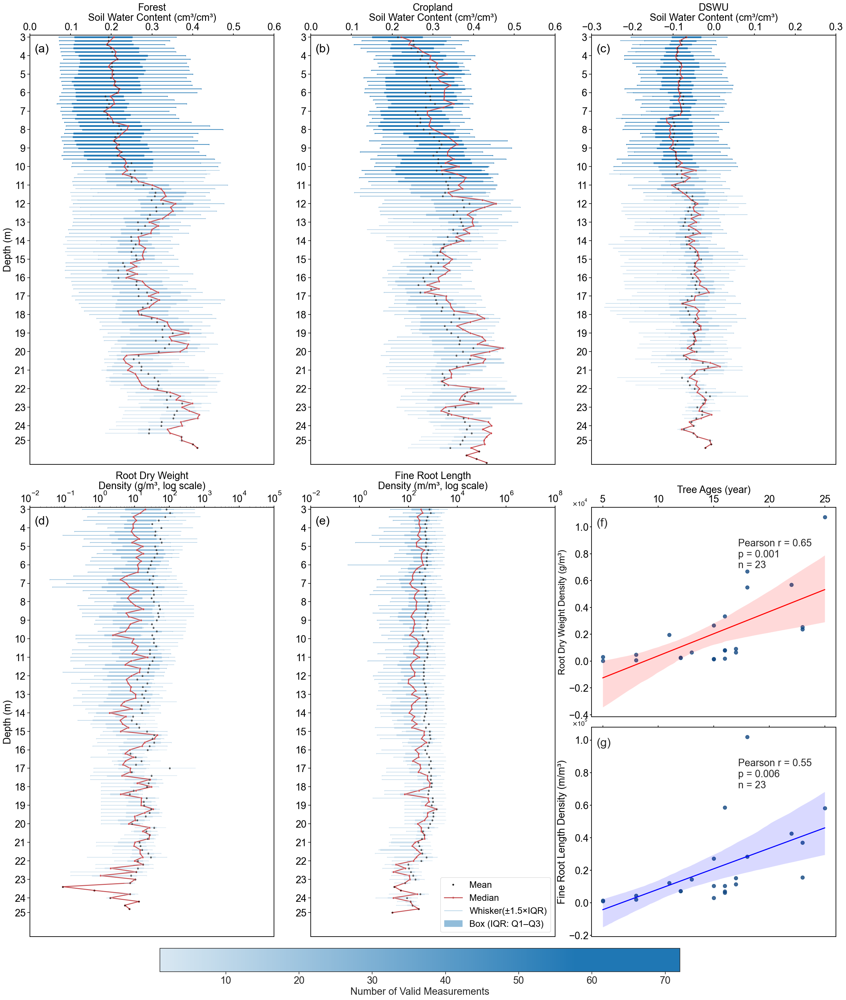

In [11]:
### 20250822以后
# -*- coding: utf-8 -*-
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.lines import Line2D
from matplotlib.ticker import ScalarFormatter
import matplotlib.font_manager as fm
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import ScalarFormatter
# 设置字体
#font_path = r'C:\Users\Administrator\Downloads\Arial\Arial Unicode MS.ttf'
#font_prop = fm.FontProperties(fname=font_path)
plt.rcParams["font.family"] = "Arial"
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# 文件路径
file_path = r'C:\Users\Administrator\Desktop\AFM\箱线图\water.xlsx'

# Sheet和标题
sheet_names = ['forestwater(3)', 'soilwater(3)', 'SWSD(3)',
               'Root Dry Weight Density (3)', 'Fine Root Length Density (3)']
titles = ['Forest', 'Cropland', 'DSWU', 'Root Dry Weight', 'Fine Root Length']

# 创建渐变色映射
def create_monochrome_colormap(color_rgb, n=256, gamma=1.0):
    colors = []
    for i in np.linspace(0, 1, n):
        factor = i ** gamma
        r = (1 - factor) * 1.0 + factor * color_rgb[0]
        g = (1 - factor) * 1.0 + factor * color_rgb[1]
        b = (1 - factor) * 1.0 + factor * color_rgb[2]
        colors.append((r, g, b))
    return LinearSegmentedColormap.from_list('mono_cmap', colors)

main_rgb = mcolors.to_rgb("#1f77b4")
base_cmap = create_monochrome_colormap(main_rgb, gamma=1.1)
brightness_factors = [1.0] * 5
colormap_start = 0.2
colormap_end = 1.2
cmaps = []
for factor in brightness_factors:
    colors_scaled = []
    for c in base_cmap(np.linspace(colormap_start, colormap_end, 256)):
        r, g, b = c[:3]
        r_new = min(r * factor, 1)
        g_new = min(g * factor, 1)
        b_new = min(b * factor, 1)
        colors_scaled.append((r_new, g_new, b_new))
    cmap_scaled = LinearSegmentedColormap.from_list(f'cmap_factor_{factor}', colors_scaled)
    cmaps.append(cmap_scaled)

# 创建主图
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(32, 36), sharey=True)
plt.subplots_adjust(wspace=0.15, hspace=0.10)
axes = axes.flatten()

# 遍历前五个子图（箱线图）
for idx, (sheet, title, cmap) in enumerate(zip(sheet_names, titles, cmaps)):
    ax = axes[idx]
    df = pd.read_excel(file_path, sheet_name=sheet, header=None)
    depths = df.iloc[0, :].astype(float).values
    data = df.iloc[1:, :].astype(float).values.T
    adjusted_depths = np.arange(len(depths))

    all_data = data.flatten()
    all_data = all_data[~np.isnan(all_data)]
    p1 = np.percentile(all_data, 0.1)
    p99 = np.percentile(all_data, 99.9)
    if sheet in ['Root Dry Weight Density (3)', 'Fine Root Length Density (3)']:
        data_trimmed = np.where((data > 0) & (data <= p99), data, np.nan)
    else:
        data_trimmed = np.where((data >= p1) & (data <= p99), data, np.nan)

    means = np.nanmean(data_trimmed, axis=1)
    mins = np.nanmin(data_trimmed, axis=1)
    maxs = np.nanmax(data_trimmed, axis=1)
    valid_counts = np.sum(~np.isnan(data_trimmed), axis=1)
    norm = mcolors.Normalize(vmin=1, vmax=72)
    colors = [cmap(norm(c)) for c in valid_counts]

    for i, (d, color) in enumerate(zip(data_trimmed, colors)):
        d_clean = d[~np.isnan(d)]
        if len(d_clean) > 0:
            bp = ax.boxplot(
                d_clean,
                positions=[adjusted_depths[i]],
                vert=False,
                widths=0.3,
                patch_artist=True,
                boxprops=dict(facecolor=color, color=color),
                medianprops=dict(color='red'),
                whiskerprops=dict(color=color),
                capprops=dict(color=color),
                flierprops=dict(marker=''),
                showfliers=False
            )
            if i == 0:
                box_legend = bp['boxes'][0]
                whisker_legend = bp['whiskers'][0]
                cap_legend = bp['caps'][0]

    medians = np.nanmedian(data_trimmed, axis=1)
    median_line, = ax.plot(medians, adjusted_depths, 'ro-', label='Median', linewidth=2, markersize=3)
    mean_point, = ax.plot(means, adjusted_depths, 'ko', label='Mean', markersize=3)
    for i in range(len(adjusted_depths)):
        ax.hlines(y=adjusted_depths[i], xmin=mins[i], xmax=maxs[i], color=colors[i], alpha=0.6)

    ax.set_title(title, fontsize=22)
    ax.text(0.02, 0.98, f"({chr(97+idx)})", transform=ax.transAxes,
            fontsize=26, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
    ax.tick_params(labelsize=22)
    ax.tick_params(axis='y', which='both', direction='out', length=6, width=1.2, color='black')
    ax.grid(False)
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.xaxis.set_tick_params(labelsize=22)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_useOffset(True)
    formatter.set_powerlimits((-2, 2))
    ax.xaxis.set_major_formatter(formatter)
    ax.figure.canvas.draw()
    ax.xaxis.get_offset_text().set_fontsize(22)
    ax.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')

    # x轴标题
    if sheet == 'forestwater(3)' or sheet == 'soilwater(3)':
        ax.set_xlim(0, 0.6)
        ax.set_xlabel('Soil Water Content (cm³/cm³)', fontsize=22)
    elif sheet == 'SWSD(3)':
        ax.set_xlim(-0.3, 0.3)
        ax.set_xlabel('Soil Water Content (cm³/cm³)', fontsize=22)
    elif sheet == 'Fine Root Length Density (3)':
        ax.set_xscale('log')
        ax.set_xlim(0.01, 100000000)
        ax.set_xlabel('Density (m/m³, log scale)', fontsize=22)
    elif sheet == 'Root Dry Weight Density (3)':
        ax.set_xscale('log')
        ax.set_xlim(0.01, 100000)
        ax.set_xlabel('Density (g/m³, log scale)', fontsize=22)

    integer_indices = [i for i, depth in enumerate(depths) if depth.is_integer()]
    integer_depths = [depths[i] for i in integer_indices]
    adjusted_integer_depths = [adjusted_depths[i] for i in integer_indices]
    ax.set_yticks(adjusted_integer_depths)
    ax.set_yticklabels([f"{int(d)}" for d in integer_depths], fontsize=22)
    ax_row, ax_col = divmod(idx, 3)
    if ax_col == 0:
        ax.set_ylabel('Depth (m)', fontsize=22)
    ax.invert_yaxis()

# 添加图例（最后一个子图）
median_legend = Line2D([0], [0], color='black', linestyle='none', marker='s', markersize=3, label='Median')
handles = [mean_point, median_line, whisker_legend, box_legend]
labels = ['Mean', 'Median', 'Whisker(±1.5×IQR)', 'Box (IQR: Q1–Q3)']
axes[4].legend(handles=handles, labels=labels, loc='lower right', fontsize=20)

# 替换第六个子图为嵌套两个回归图
bbox = axes[5].get_position()
axes[5].remove()

gap = 0.009  # 控制上下图之间的空隙（推荐范围：0.01~0.05）

# 图的总高度减去 gap 后分配给两个图
h1 = (bbox.height - gap) * 0.5
h2 = h1  # 保持两图等高

# 新的上下位置
ax1 = fig.add_axes([bbox.x0, bbox.y0 + h2 + gap, bbox.width, h1])
ax2 = fig.add_axes([bbox.x0, bbox.y0, bbox.width, h2])

# 读取回归数据
df_reg = pd.read_excel(file_path, sheet_name='RDWD with FRLD (2)')
x = df_reg['Tree ages']
y1 = df_reg['root dry weight density']
y2 = df_reg['Fine root length density']

# 回归图绘制
sns.set(style="white")
sns.regplot(x=x, y=y1, ax=ax1, scatter_kws={'s': 65,'color': '#104680'}, line_kws={'color': 'red'}, ci=95)
sns.regplot(x=x, y=y2, ax=ax2, scatter_kws={'s': 65,'color': '#104680'}, line_kws={'color': 'blue'}, ci=95)

ax1.set_xlabel('Tree Ages (year)', fontsize=22)
ax1.set_ylabel('Root Dry Weight Density (g/m³)', fontsize=20)
ax1.text(0.02, 0.95, '(f)', transform=ax1.transAxes, fontname='Arial', va='top',fontsize=26)
ax1.tick_params(direction='out')
ax1.xaxis.set_label_position('top')
ax1.xaxis.tick_top()
# Y轴科学计数法
ax1.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax1.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
# 获取 offset text 对象
y_offset = ax1.yaxis.get_offset_text()

# 修改位置 (x, y) 是轴坐标系位置，默认在(0,1)
y_offset.set_x(-0.08)  # 左右移动
y_offset.set_y(1.02)   # 上下移动
ax1.tick_params(labelbottom=False, bottom=False)
ax1.xaxis.get_label().set_visible(True)
ax1.tick_params(labelbottom=False)
ax1.tick_params(axis='both', labelsize=22)
ax1.set_title("", fontsize=22, pad=17)
#ax2.set_xlabel('Tree Ages (year)', fontsize=12)
ax2.set_ylabel('Fine Root Length Density (m/m³)', fontsize=22)
#ax2.tick_params(direction='out')
ax2.text(0.02, 0.95, '(g)', transform=ax2.transAxes, fontname='Arial', va='top',fontsize=26)
ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax2.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
# 获取 offset text 对象
y_offset = ax2.yaxis.get_offset_text()
# 修改位置 (x, y) 是轴坐标系位置，默认在(0,1)
y_offset.set_x(-0.08)  # 左右移动
y_offset.set_y(1.02)   # 上下移动
ax2.tick_params(labelbottom=False)
ax2.tick_params(labelbottom=False, bottom=False)  # 隐藏底部刻度线和刻度标签
ax2.set_xticklabels([])                           # 确保刻度标签消失
ax2.xaxis.get_label().set_visible(False)           # 显示顶部标签
ax2.tick_params(axis='both', labelsize=22)
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()
ax2.set_xticklabels([]) 
ax1.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')
ax2.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')
ax1.xaxis.get_offset_text().set_fontsize(14)
ax1.yaxis.get_offset_text().set_fontsize(14)
ax2.xaxis.get_offset_text().set_fontsize(14)
ax2.yaxis.get_offset_text().set_fontsize(14)
def add_stats(ax, x, y):
    # 计算 Pearson 相关系数和 p 值
    r_value, p_value = stats.pearsonr(x, y)
    r_squared = r_value ** 2  # R² 值
    n = len(x)  # 数据点个数
    # 使用 Pearson 相关系数和 p 值
    ax.annotate(f'Pearson r = {r_value:.2f}\np = {p_value:.3f}\nn = {n}', 
                xy=(0.60, 0.85), xycoords='axes fraction',
                fontsize=22, verticalalignment='top')#R² = {r_squared:.2f}\n
add_stats(ax1, x, y1)
add_stats(ax2, x, y2)

# 色条
sm = ScalarMappable(cmap=cmaps[-1], norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Number of Valid Measurements', fontsize=22)
cbar.ax.tick_params(labelsize=22)

# 保存
#save_path = r'C:\Users\Administrator\Desktop\AFM\箱线图\combined_6plots.png'
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\箱线图\combined_6plots.png', dpi=300, bbox_inches='tight')
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\箱线图\combined_6plots_withoutAnomaly Point.svg', format='svg',bbox_inches='tight', pad_inches=0.1)
plt.show()